# Generic notebook to study calibraded  spectra for HD205905 data 8 jun 2017
==================================================================================================

- author : Sylvie Dagoret-Campagne
- affiliation : LAL/IN2P3/CNRS FRANCE
- creation date   : 10th October 2017
- update : April 29th 2020 : For Figure of holospec article
- last update June 24th 2020



In [3]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [4]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

print(theNotebook)
from IPython.display import Image, display
import sys
sys.path.append("../../common_tools/")
from common_notebook import *

init_notebook()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
StudyCalibratedSpectraContamination
ccdproc version 1.3.0.post1
bottleneck version 1.3.2
/Users/dagoret/MacOSX/GitHub/LSST/CTIOAnaJun2017/CTIOAnaJun2017/ana_08jun17/HD205905


In [5]:
%config InlineBackend.rc = {}
matplotlib.rc_file("../../templates/matplotlibrc")


Bad key "axes.color_cycle" on line 215 in
../../templates/matplotlibrc.
You probably need to get an updated matplotlibrc file from
http://github.com/matplotlib/matplotlib/blob/master/matplotlibrc.template
or from the matplotlib source distribution


In [6]:
#matplotlib.rcParams.update({'font.size': 10})
#matplotlib.rcParams.update({'font.size': 10})
#matplotlib.rcParams.update({'figure.figsize' : (10, 5)})

In [7]:
matplotlib.rcParams.update({'font.size': 15, 'lines.linewidth': 2, 'lines.markersize': 15})
matplotlib.rcParams["axes.labelsize"]="large"
matplotlib.rcParams["axes.linewidth"]=2.0
matplotlib.rcParams["xtick.major.size"]=10
matplotlib.rcParams["ytick.major.size"]=10
matplotlib.rcParams["ytick.minor.size"]=6
matplotlib.rcParams["xtick.labelsize"]="large"
matplotlib.rcParams["ytick.labelsize"]="large"
matplotlib.rcParams["figure.figsize"]=(10,5)
matplotlib.rcParams['axes.titlesize'] = 15
matplotlib.rcParams['axes.titleweight'] = 'bold'
#matplotlib.rcParams['axes.facecolor'] = 'blue'
matplotlib.rcParams['xtick.direction'] = 'out'
matplotlib.rcParams['ytick.direction'] = 'out'
matplotlib.rcParams['lines.markeredgewidth'] = 0.3 # the line width around the marker symbol
matplotlib.rcParams['lines.markersize'] = 10  # markersize, in points
matplotlib.rcParams['grid.alpha'] = 1. # transparency, between 0.0 and 1.0
matplotlib.rcParams['grid.linestyle'] = '-' # simple line
matplotlib.rcParams['grid.linewidth'] = 0.6 # in points 
plt.rc('legend',fontsize='medium') # using a named size

In [8]:
 from scipy import interpolate

# Configuration 

## Constants for conversions

In [9]:
m_to_mm=1000.
mm_to_m=1e-3
inch_to_mm=25.4
mm_to_inch=1./inch_to_mm
mm_to_micr=1e3
micr_to_m=1e-6
micr_to_mm=1e-3
m_to_micr=1./micr_to_m
m_to_cm=100.
m_to_nm=1e9
nm_to_m=1./m_to_nm
nm_to_micr=0.001

In [10]:
arcdeg_to_arcmin=60.
arcmin_to_arcdeg=1./arcdeg_to_arcmin
arcmin_to_arcsec=60.
arcdeg_to_arcsec=arcdeg_to_arcmin*arcmin_to_arcsec
arcsec_to_arcdeg=1./arcdeg_to_arcsec

In [11]:
deg_to_rad=np.pi/180.

In [12]:
rad_to_deg=1./deg_to_rad
rad_to_arcsec=rad_to_deg*arcdeg_to_arcsec
rad_to_arcmin=rad_to_deg*arcdeg_to_arcmin
arcmin_to_rad=1./rad_to_arcmin

## Constants for telescope

### Telescope

In [13]:
Tel_Focal_Length=12.6 # m : Focal length of the telescope
Tel_Diameter=0.9 # m : Diameter of the telescope    
Tel_Fnum=Tel_Focal_Length/Tel_Diameter
plt_scale=206265/(Tel_Focal_Length*m_to_mm)  # arcsec per mm

### Filter

In [14]:
Filt_D=0.05769 # m distance of the filter position wrt CCD plane
Filt_size=3*inch_to_mm

#### CCD detector

In [15]:
Det_xpic=24.0 # microns per pixel
#Det_NbPix=2048 # number of pixels per CCD side
Det_NbPix=2512 # number of pixels per CCD side For 400 only
Det_size=Det_xpic*Det_NbPix*micr_to_mm # CCD size in mm, 5 cm or 2 inch

## Dispersion functions

### Utility

In [16]:
def find_nearest_idx(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

### Dispersion

In [17]:
def Dispersion(wl,a,D):
    """ 
    Dispersion(wl,a,D) : number of dx per wavelength
    input arguments:
    - wl : wavelength
    - a  : line pitch
    - D  : Distance CCD-Hologram
    
    recommended : all input arguments should be expressed in microns.
    
    - output : dx, x in microns and lambdas in microns
    """
    X=D/a*wl/np.sqrt(1-(wl/a)**2)
    return X

In [18]:
def Dispersion_Rate(wl,a,D):
    """
    Dispersion_Rate(wl) for order 1 : number of dx per wavelength
    input arguments:
    - wl : wavelength
    - a  : line pitch
    - D  : Distance CCD-Hologram
    
    recommended : all input arguments should be expressed in microns.
    
    - output : dx/dlambda, x in microns and lambdas in microns
    
    """
    dxdlambda=D/a*(np.sqrt(1-(wl/a)**2)+ (wl/a)**2)/(1-(wl/a)**2)
    return dxdlambda 

In [90]:
def Dispersion_Rate2(wl,a,D,p=1):
    """
    Dispersion_Rate(wl) for order 2: number of dx per wavelength
    input arguments:
    - wl : wavelength
    - a  : line pitch
    - D  : Distance CCD-Hologram
    - p : order
    
    recommended : all input arguments should be expressed in microns.
    
    - output : dx/dlambda, x in microns and lambdas in microns
    
    """
    dxdlambda=D*p/a/(np.sqrt(1-(p*wl/a)**2))**3
    return dxdlambda 

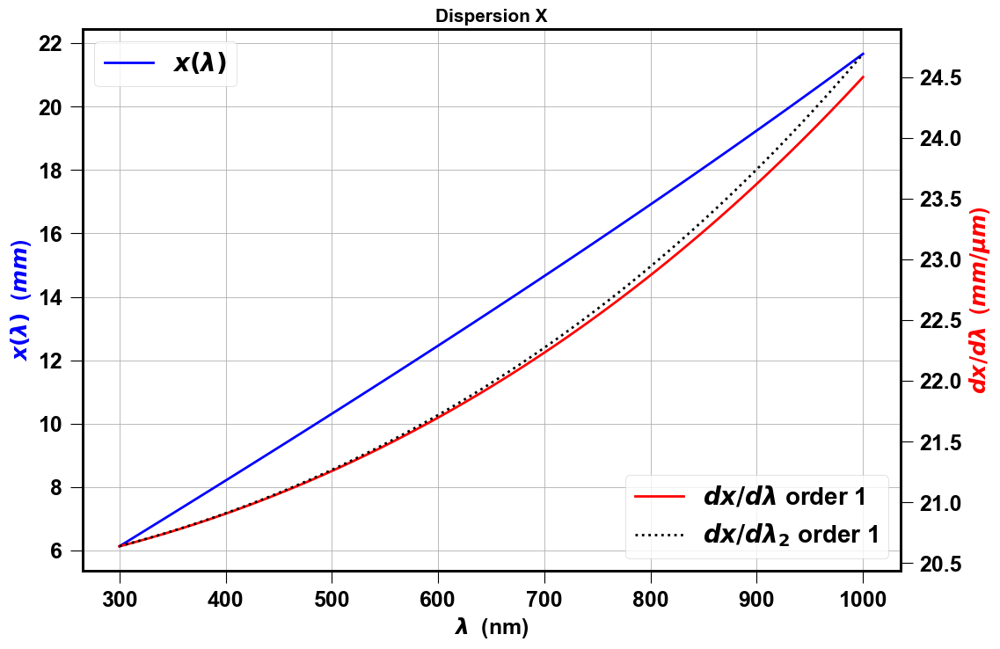

In [96]:
fig, ax1 = plt.subplots(figsize=(12,8))
WL=np.linspace(300.,1000.,100)
a=1/350.*mm_to_micr
D=58*mm_to_micr

Y1=Dispersion(WL*nm_to_micr,a,D)*micr_to_mm
ax1.plot(WL,Y1,"b",label="$x(\lambda)$")

ax1.set_xlabel("$\lambda$  (nm)")
ax1.set_ylabel("$x(\lambda)$  ($mm$)",color="blue")
ax1.set_title("Dispersion X")
ax1.legend(loc="upper left")
ax1.grid(True)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

Y2=Dispersion_Rate(WL*nm_to_micr,a,D)*micr_to_mm  ## mm per microns
Y3=Dispersion_Rate2(WL*nm_to_micr,a,D)*micr_to_mm  ## mm per microns
Y4=Dispersion_Rate2(WL*nm_to_micr,a,D,p=2)*micr_to_mm  ## mm per microns
ax2.plot(WL, Y2,"r",label="$dx/d\lambda$ order 1")
ax2.plot(WL, Y3,"k:",label="$dx/d\lambda_2$ order 1")
#ax2.plot(WL, Y4,"g:",label="$dx/d\lambda$ bis order 2")
ax2.set_xlabel("$\lambda$  (nm)")
ax2.set_ylabel("$dx/d\lambda$  ($mm/\mu m$)",color="red")
#ax2.set_title("Dispersion rate")
ax2.legend(loc="lower right")
ax2.grid(False)

Text(0,0.5,'$dx/d\\lambda$ ratio (no unit)')

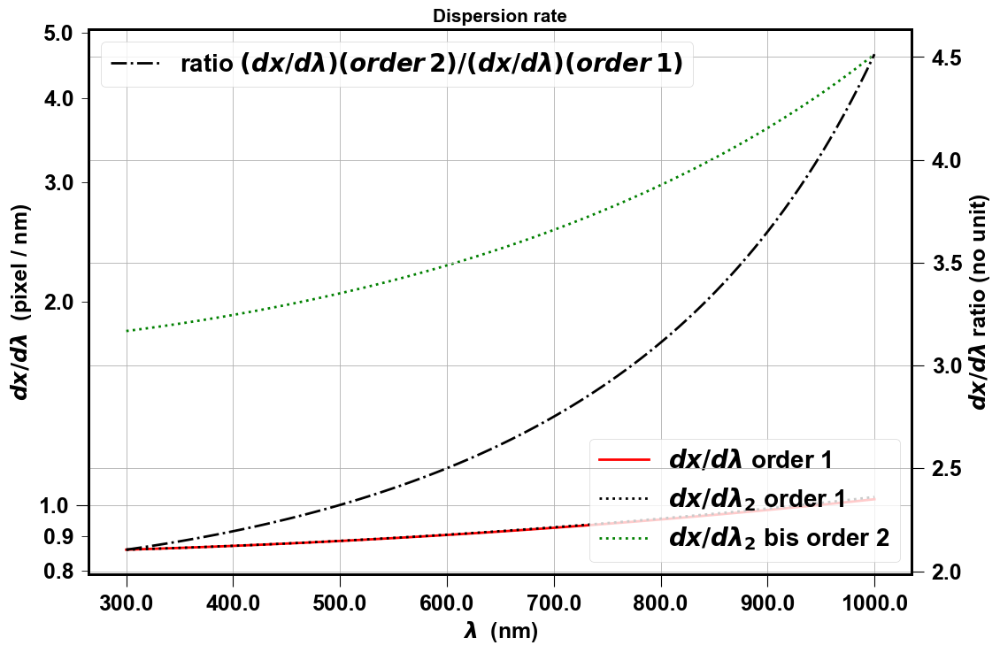

In [125]:
fig, ax1 = plt.subplots(figsize=(12,8))
WL=np.linspace(300.,1000.,100)
a=1/350.*mm_to_micr
D=58*mm_to_micr


Y2=Dispersion_Rate(WL*nm_to_micr,a,D)/Det_xpic*1e-3  ## mm per microns
Y3=Dispersion_Rate2(WL*nm_to_micr,a,D)/Det_xpic*1e-3   ## mm per microns
Y4=Dispersion_Rate2(WL*nm_to_micr,a,D,p=2)/Det_xpic*1e-3   ## mm per microns
ax1.plot(WL, Y2,"r",label="$dx/d\lambda$ order 1")
ax1.plot(WL, Y3,"k:",label="$dx/d\lambda_2$ order 1")
ax1.plot(WL, Y4,"g:",label="$dx/d\lambda_2$ bis order 2")
ax1.set_xlabel("$\lambda$  (nm)")
ax1.set_ylabel("$dx/d\lambda$  (pixel / nm)")
ax1.set_title("Dispersion rate")
ax1.legend(loc="lower right")
ax1.grid(True)
ax1.set_yscale("log")
from matplotlib.ticker import ScalarFormatter
from matplotlib.ticker import FuncFormatter
    
formatter = FuncFormatter(lambda y, _: '{:.1f}'.format(y))
    
for axis in [ax1.xaxis,  ax1.yaxis]:
    formatter = ScalarFormatter()
    formatter.set_scientific(False)
    axis.set_major_formatter(formatter)
for axis in [ax1.xaxis,  ax1.yaxis]:
    formatter = FuncFormatter(lambda y, _: '{:.1f}'.format(y))
    axis.set_major_formatter(formatter)
    axis.set_minor_formatter(formatter)

    #axarr[1].xaxis.set_minor_formatter(matplotlib.ticker.ScalarFormatter())
    #axarr[1].xaxis.set_minor_formatter(matplotlib.ticker.FormatStrFormatter("%.0f"))
    #axarr[1].xaxis.set_major_formatter(matplotlib.ticker.ScalarFormatter())
    #axarr[1].xaxis.set_major_formatter(matplotlib.ticker.FormatStrFormatter("%.0f"))

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
ax2.plot(WL, Y4/Y3,"k-.",label="ratio $(dx/d\\lambda)(order\,2)/(dx/d\\lambda)(order\,1)$")
ax2.legend()
ax2.set_ylabel("$dx/d\lambda$ ratio (no unit)")

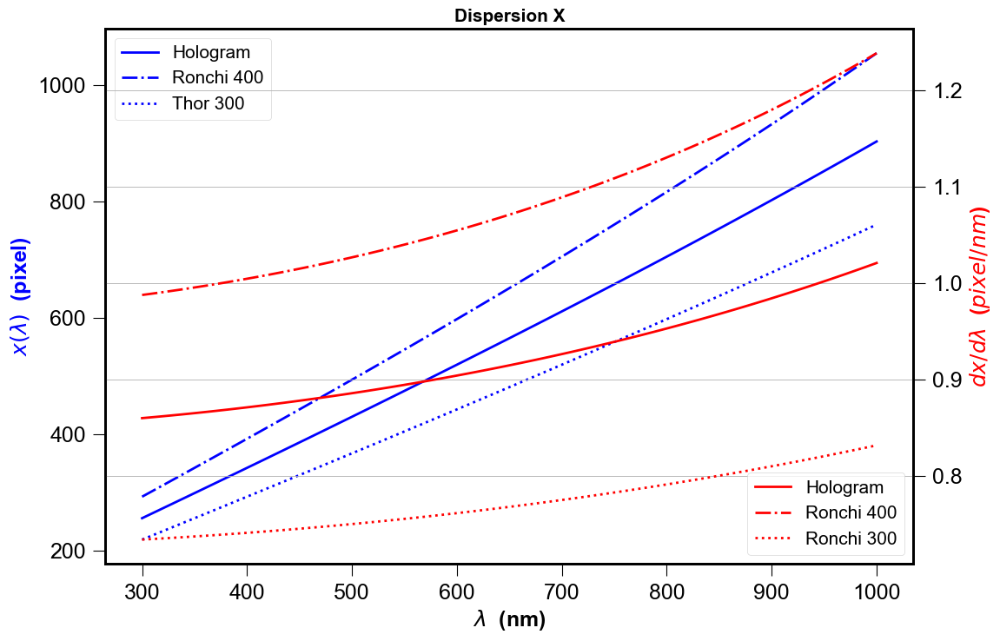

In [20]:
fig, ax1 = plt.subplots(figsize=(12,8))
WL=np.linspace(300.,1000.,100)
a=1/350.*mm_to_micr
D=58*mm_to_micr

Y1=Dispersion(WL*nm_to_micr,a,D)/Det_xpic   # pixel
Y1400=Dispersion(WL*nm_to_micr,1/400.*mm_to_micr,D)/Det_xpic   # pixel
Y1300=Dispersion(WL*nm_to_micr,1/300.*mm_to_micr,D)/Det_xpic   # pixel
ax1.plot(WL,Y1,"b",label="Hologram")
ax1.plot(WL,Y1400,"b-.",label="Ronchi 400")
ax1.plot(WL,Y1300,"b:",label="Thor 300")

ax1.set_xlabel("$\lambda$  (nm)")
ax1.set_ylabel("$x(\lambda)$  (pixel)",color="blue")
ax1.set_title("Dispersion X")
ax1.legend(loc="upper left")
ax1.grid()

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

Y2=Dispersion_Rate(WL*nm_to_micr,a,D)/Det_xpic*1e-3   # pixel per nm
ax2.plot(WL, Y2,"r",label="Hologram")
Y2400=Dispersion_Rate(WL*nm_to_micr,1/400.*mm_to_micr,D)/Det_xpic*1e-3   # pixel per nm
Y2300=Dispersion_Rate(WL*nm_to_micr,1/300.*mm_to_micr,D)/Det_xpic*1e-3   # pixel per nm
ax2.plot(WL, Y2400,"r-.",label="Ronchi 400")
ax2.plot(WL, Y2300,"r:",label="Ronchi 300")

ax2.set_xlabel("$\lambda$  (nm)")
ax2.set_ylabel("$dx/d\lambda$  ($pixel/nm$)",color="red")
#ax2.set_title("Dispersion rate")
ax2.legend(loc="lower right")
#ax2.grid()

# Initialisation

## Input fits file

- containing the calibrated spectra

In [21]:
inputdir="./spectrum_calibspec"
MIN_IMGNUMBER=144
MAX_IMGNUMBER=357
date="20170608"
object_name='HD205905'
tag = "calibSpectra"
SelectTagRe='^%s_%s_([0-9]+).fits$' % (tag,date) # regular expression to select the file
SearchTagRe='^%s_%s_[0-9]+.fits$' % (tag,date)
NBIMGPERROW=2

## Output directory

In [22]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images
ensure_dir(dir_top_images) # create that directory

outputdir="./study_calibspec"
ensure_dir(outputdir)

# Open input file

In [23]:
sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe)

In [24]:
all_dates,all_airmass,all_titles,all_header,all_expo, all_leftspectra_data,all_rightspectra_data, all_leftspectra_data_stat_err , all_rightspectra_data_stat_err ,all_leftspectra_wl,all_rightspectra_wl,all_filt,all_filt1,all_filt2=BuildCalibSpec(sorted_files,sorted_numbers,object_name)

# Disperser Sorting

In [25]:
filt0_idx,filt1_idx,filt2_idx,filt3_idx,filt4_idx,filt5_idx,filt6_idx=get_filt_idx(all_filt)

In [26]:
print  Filt_names[0],' \t : filt0_idx :: ',filt0_idx
print  Filt_names[1],' \t : filt1_idx :: ',filt1_idx
print  Filt_names[2],' \t : filt2_idx :: ',filt2_idx
print  Filt_names[3],' \t : filt3_idx :: ',filt3_idx
print  Filt_names[4],' \t : filt4_idx :: ',filt4_idx
print  Filt_names[5],' \t : filt5_idx :: ',filt5_idx
print  Filt_names[6],' \t : filt6_idx :: ',filt6_idx

dia Ron400  	 : filt0_idx ::  []
dia Thor300  	 : filt1_idx ::  [ 6  8 14 15 21 25 26 29 35 37 39 40 48 49 50 52]
dia HoloPhP  	 : filt2_idx ::  [ 1 11 16 17 30 38 41 43 44 51]
dia HoloPhAg  	 : filt3_idx ::  [ 2  3 12 20 22 27 45]
dia HoloAmAg  	 : filt4_idx ::  [ 4  7  9 13 18 23 31 32 36 42 46 47]
dia Ron200  	 : filt5_idx ::  [ 0  5 10 19 24 28 33 34]
Unknown  	 : filt6_idx ::  []


# Show Spectra

/Users/dagoret/anaconda3/envs/py27/lib/python2.7/site-packages/matplotlib/figure.py:457: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


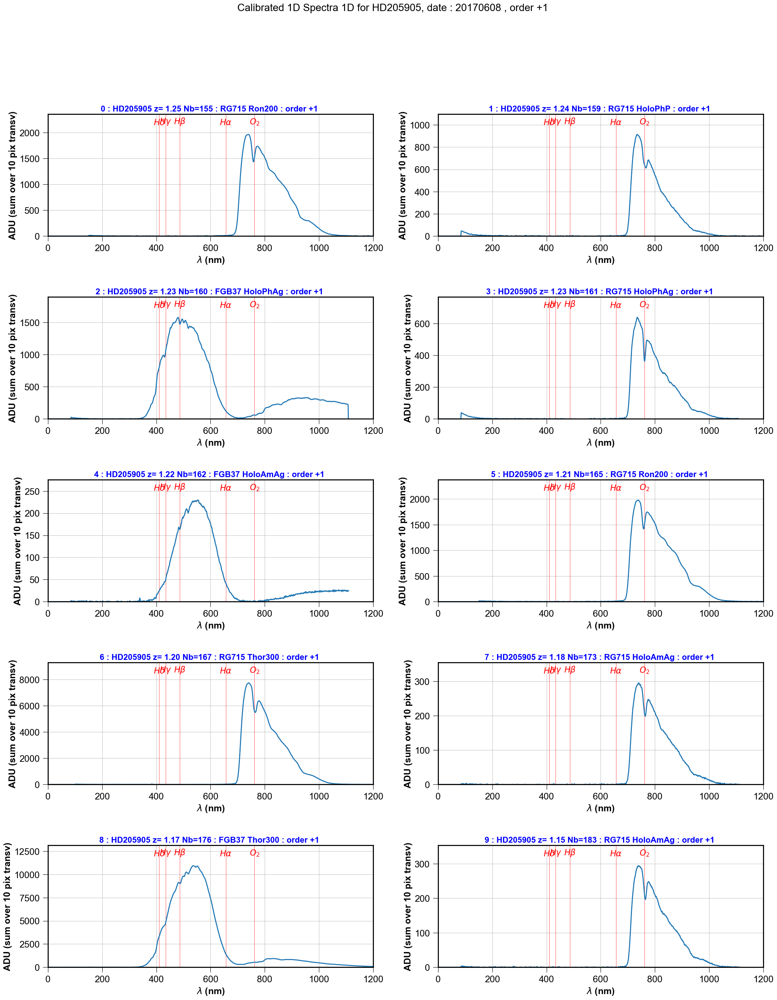

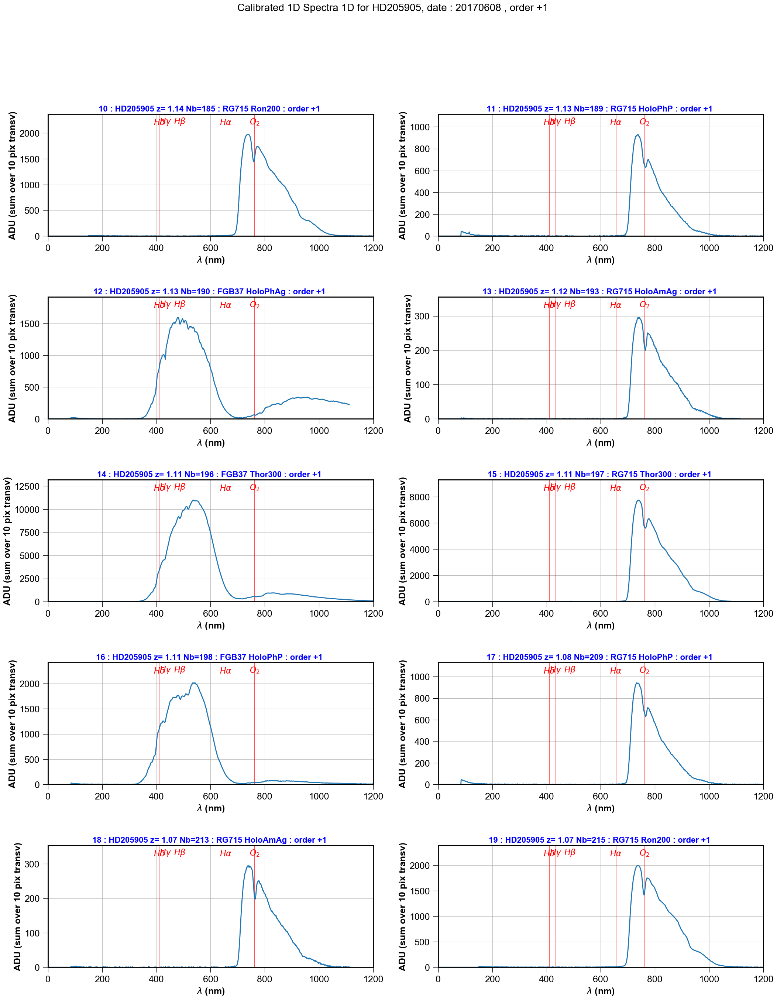

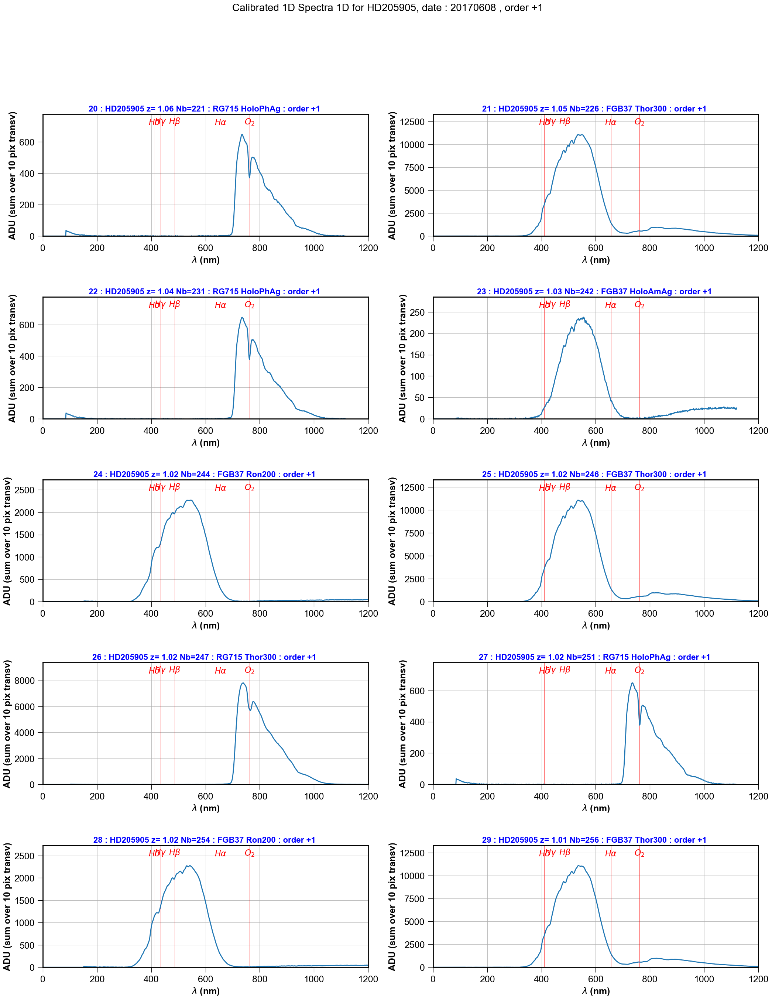

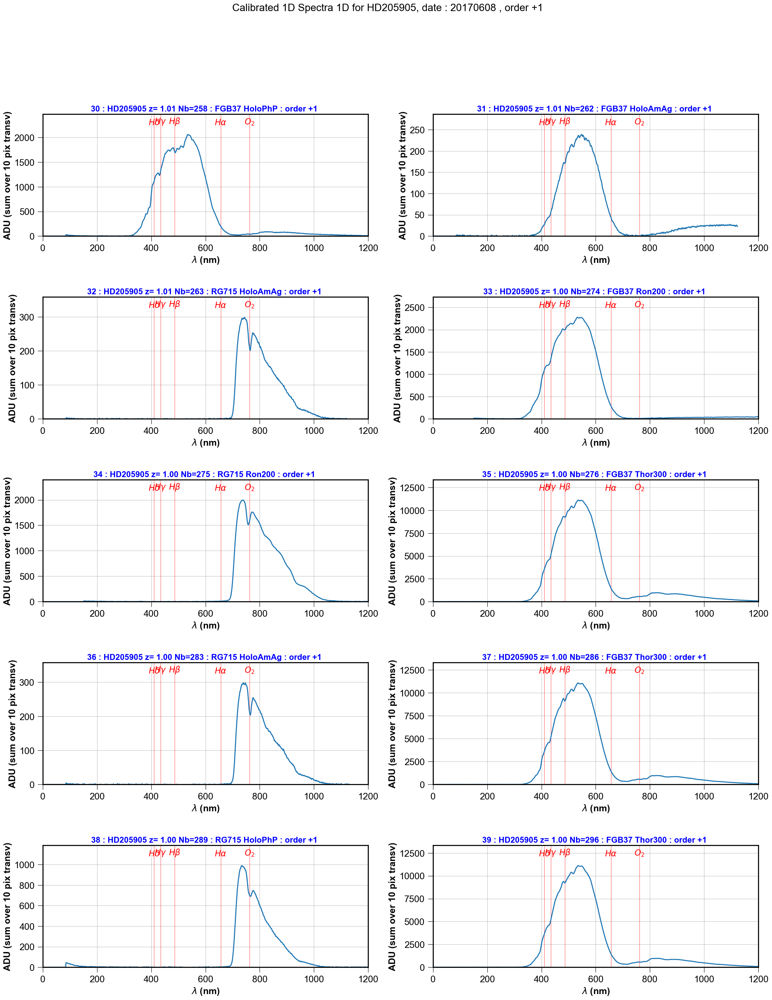

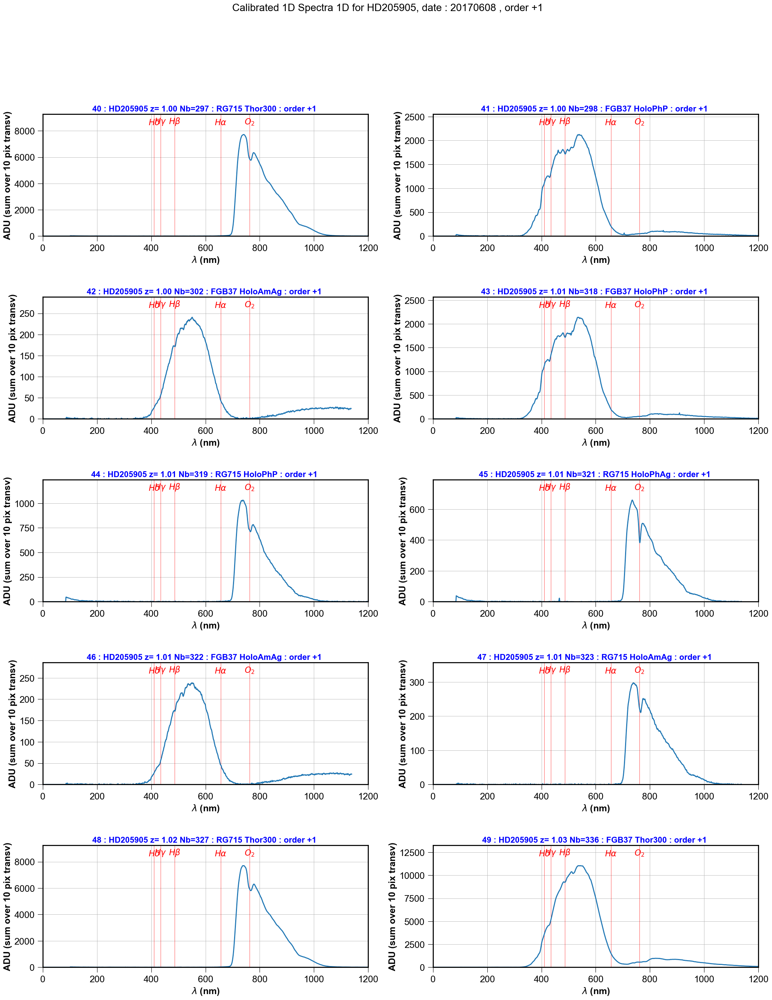

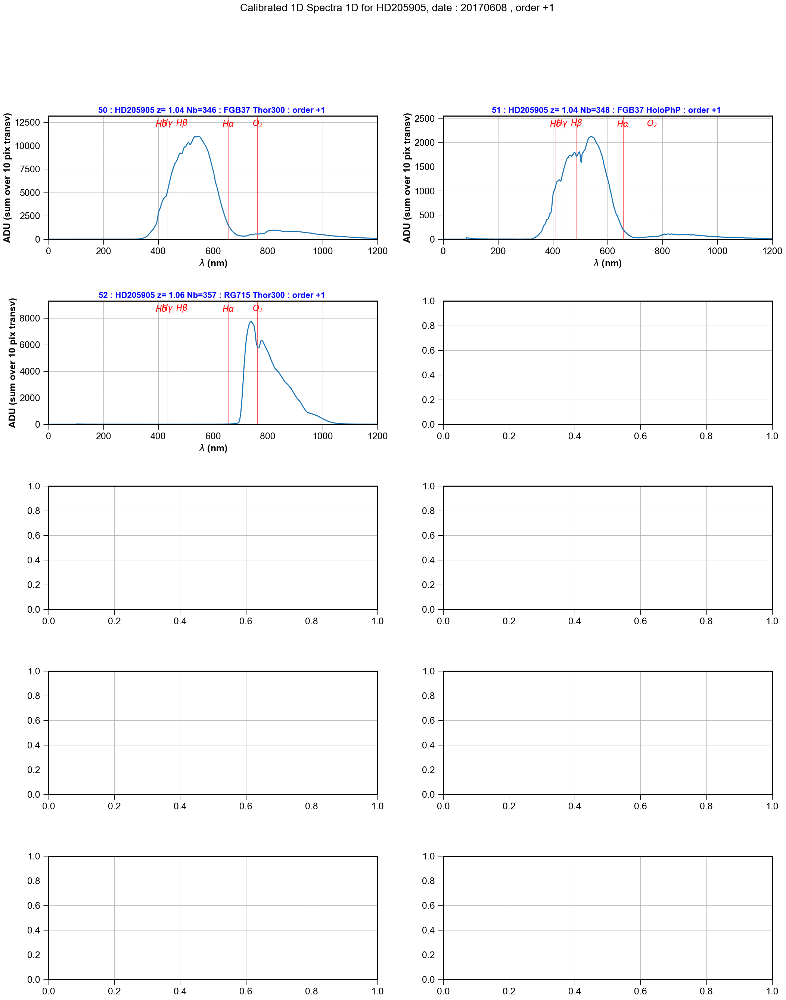

In [27]:
ShowCalibSpectrainPDF(all_rightspectra_data,all_rightspectra_data_stat_err,all_rightspectra_wl,all_titles,object_name,dir_top_images,all_filt,date,'calib1Dspectra_right.pdf','order +1')

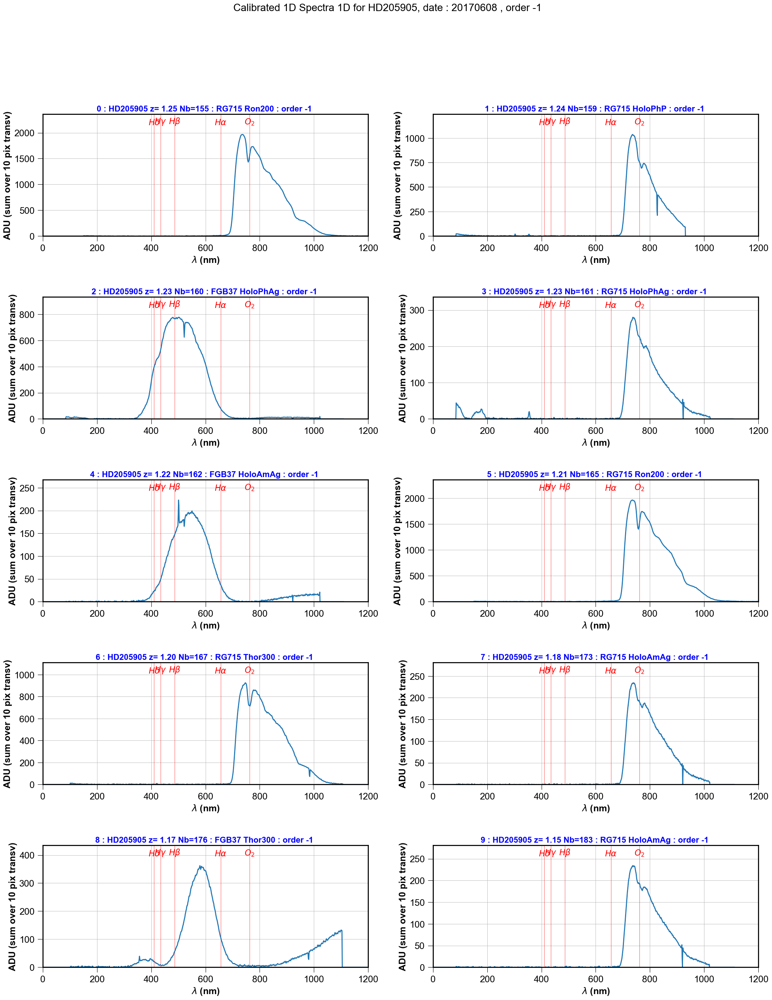

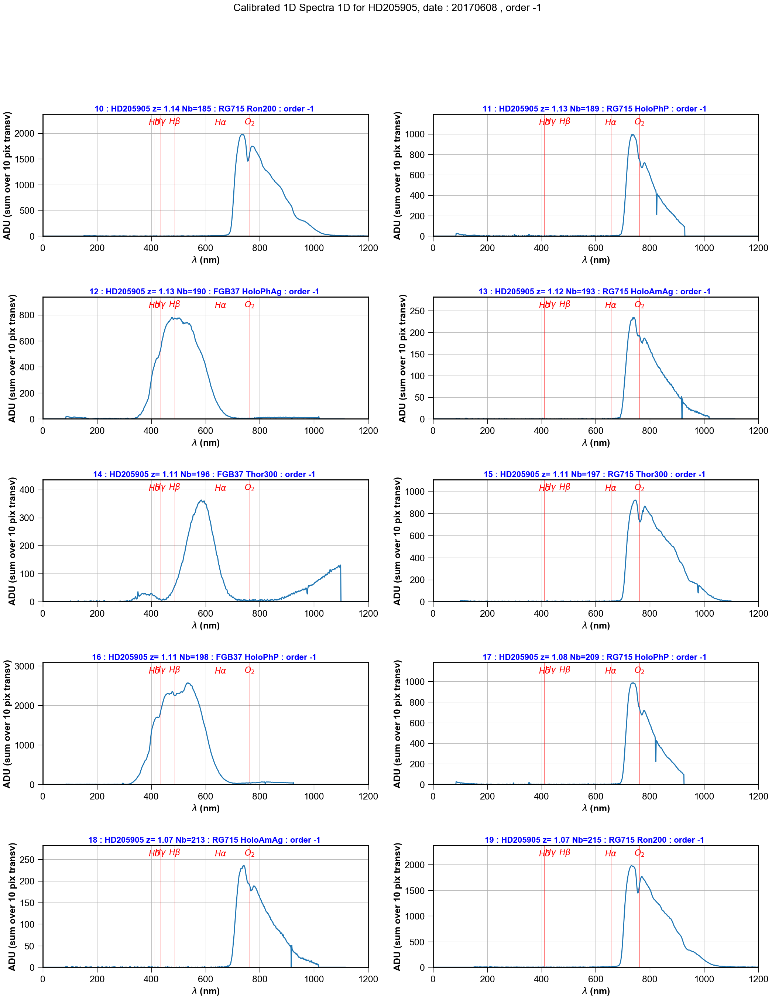

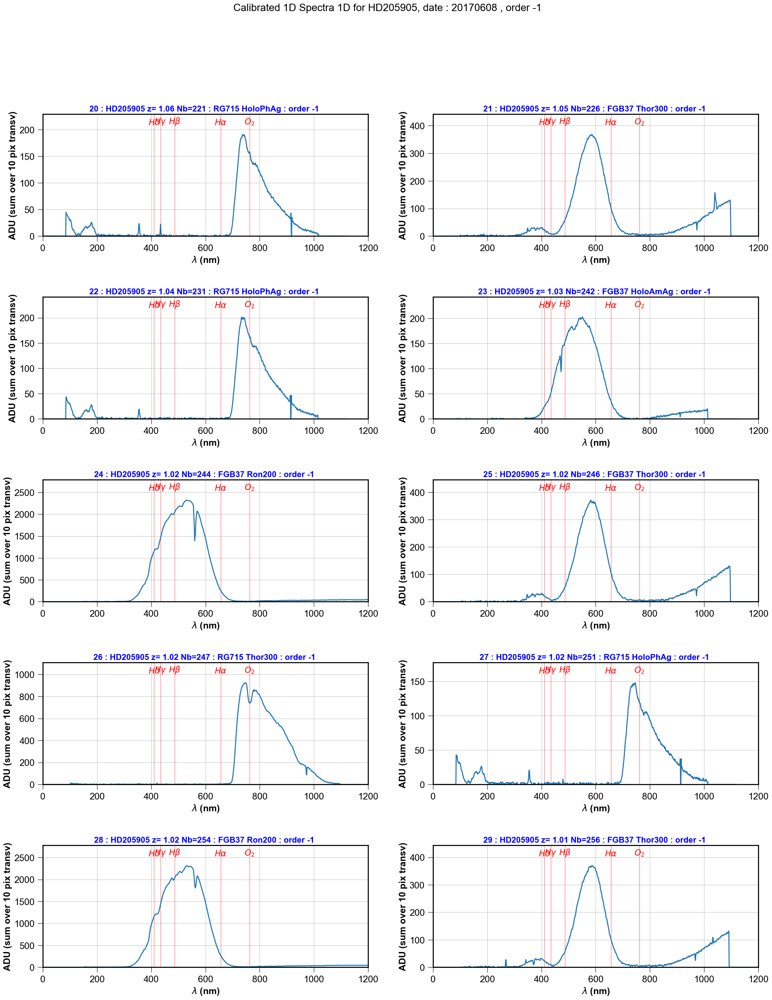

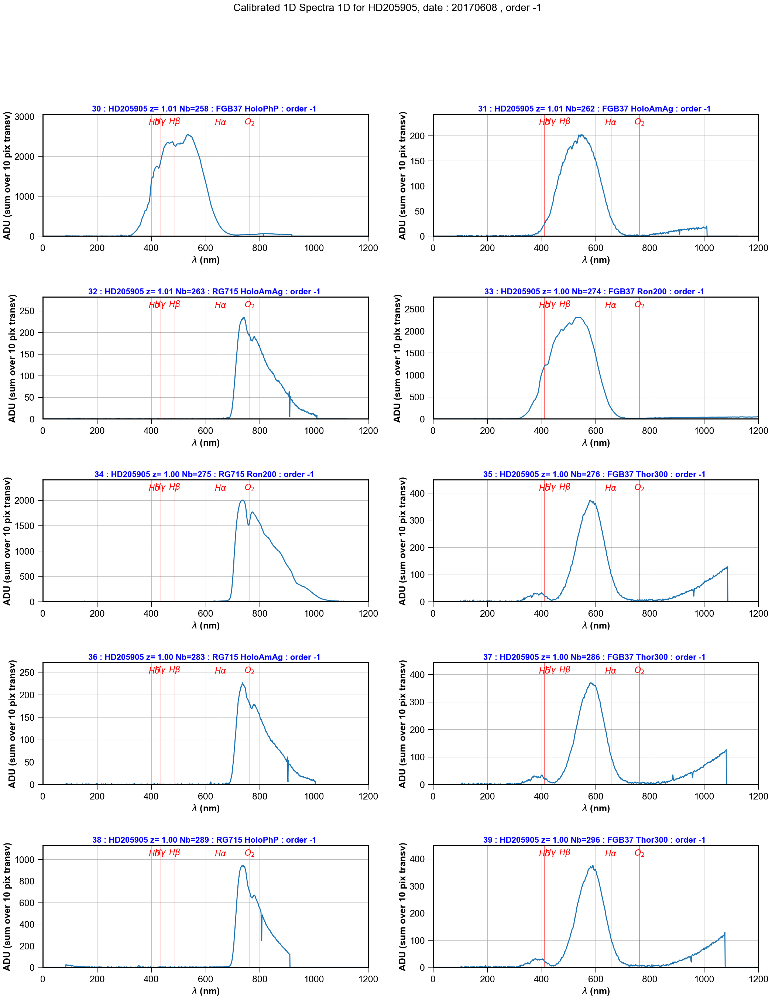

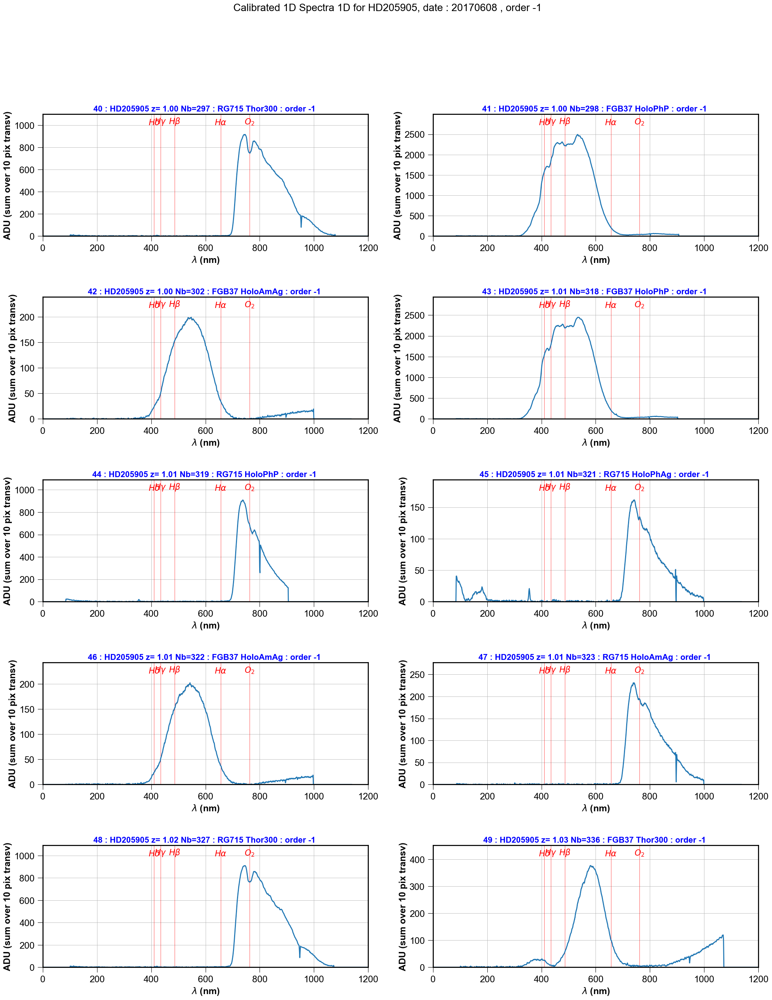

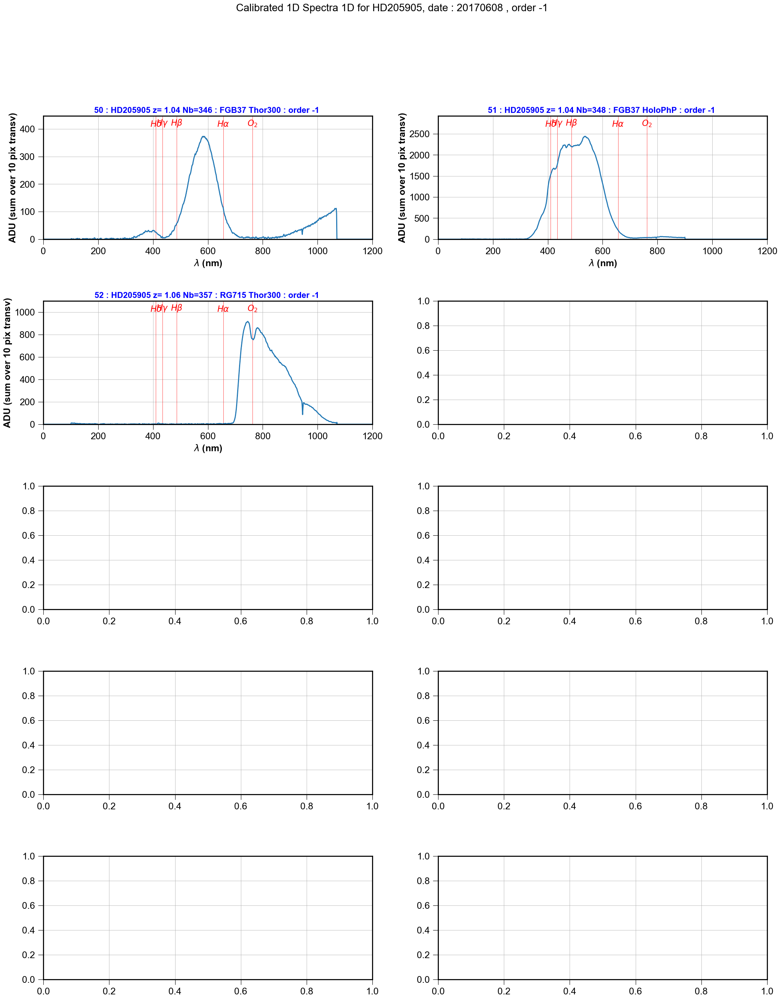

In [28]:
ShowCalibSpectrainPDF(all_leftspectra_data,all_leftspectra_data_stat_err,all_leftspectra_wl,all_titles,object_name,dir_top_images,all_filt,date,'calib1Dspectra_left.pdf','order -1')

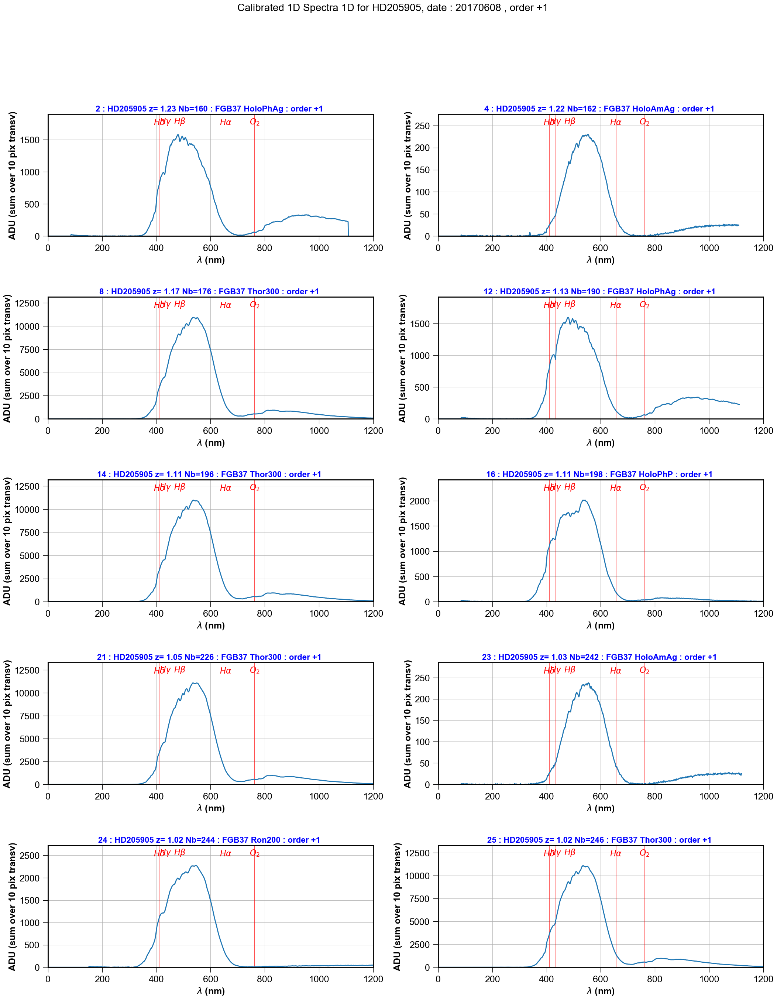

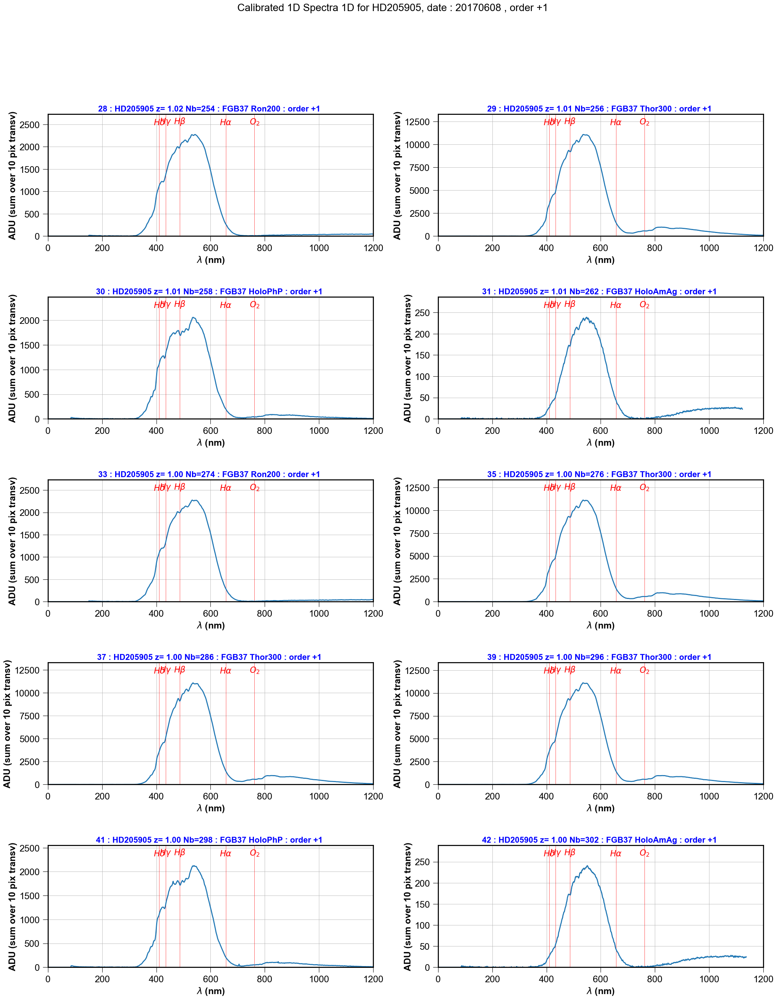

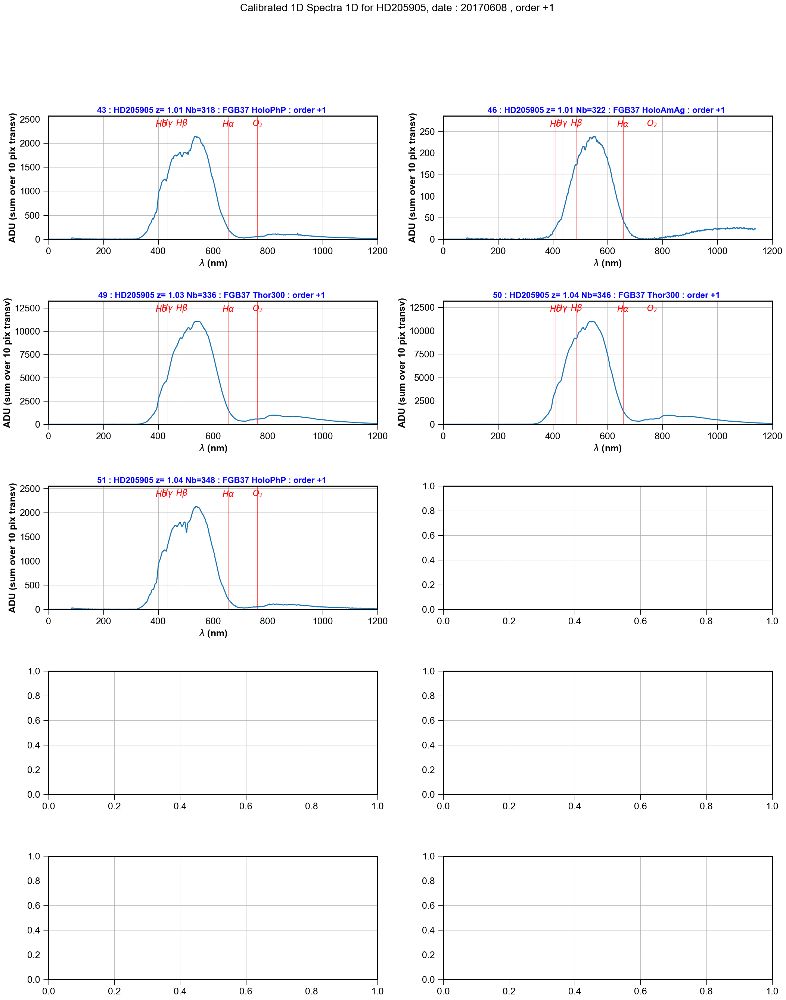

In [29]:
ShowCalibSpectrainPDFSelect(all_rightspectra_data,all_rightspectra_data_stat_err,all_rightspectra_wl,all_titles,object_name,dir_top_images,all_filt,all_filt1,all_filt2,date,'calib1DspectraSel_right.pdf','order +1')

# To study contamination by order 2 ==> Select FGB37 Filter data

## Find the indexes with tag FGB37

In [30]:
all_filt1=np.array(all_filt1)
Selected_Indexes=np.where(all_filt1=='FGB37')[0]

In [31]:
Selected_Indexes

array([ 2,  4,  8, 12, 14, 16, 21, 23, 24, 25, 28, 29, 30, 31, 33, 35, 37,
       39, 41, 42, 43, 46, 49, 50, 51])

## Remember the corresponding filters and disperser

In [32]:
all_filt2=np.array(all_filt2)
Selected_Dispersers=all_filt2[Selected_Indexes]

In [33]:
Selected_Dispersers

array(['HoloPhAg', 'HoloAmAg', 'Thor300', 'HoloPhAg', 'Thor300',
       'HoloPhP', 'Thor300', 'HoloAmAg', 'Ron200', 'Thor300', 'Ron200',
       'Thor300', 'HoloPhP', 'HoloAmAg', 'Ron200', 'Thor300', 'Thor300',
       'Thor300', 'HoloPhP', 'HoloAmAg', 'HoloPhP', 'HoloAmAg', 'Thor300',
       'Thor300', 'HoloPhP'], dtype='|S8')

In [34]:
all_filt=np.array(all_filt)
Select_Filt=all_filt[Selected_Indexes]

## Build X, Y and interpolation function

In [35]:
all_interpolate = [] # interpolation functions
all_spc= []          # spectrum
lambdas=np.linspace(300.,1100.,800) # spectrum wavelength domain
for idx in Selected_Indexes:
    index=idx
    # define (x,y)    
    x=all_rightspectra_wl[index]
    y=all_rightspectra_data[index]
    # interpolation function y = f(x)
    f = interpolate.interp1d(x, y)
    # calculate y=f(x), where x are the tabulated lambdas
    spc=f(lambdas)
    # save in container
    all_interpolate.append(f)
    all_spc.append(spc)

### Check the interpolation

(600.0, 1100.0)

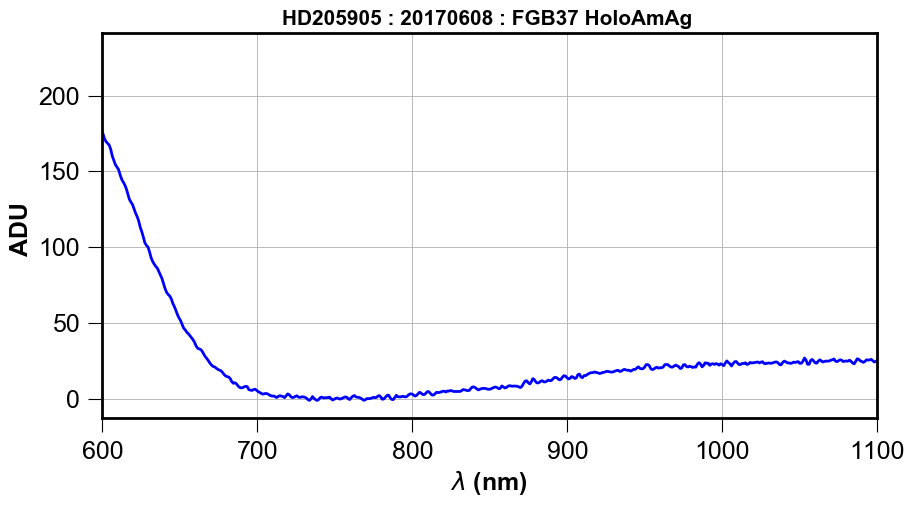

In [36]:
sel=1
title="{} : {} : {} ".format(object_name,date,Select_Filt[sel])
plt.title(title)
plt.plot(lambdas,all_spc[sel],'b-')
plt.xlabel("$\lambda$ (nm) ")
plt.ylabel("ADU ")
plt.xlim(600.,1100.)

In [37]:
from IPython.display import Latex

# Compute the ratio 


$$
\begin{equation}
Y = \frac{Y(\lambda)}{Y(\lambda / 2)}
\end{equation}
$$

In [38]:
def GiveContamination(wavelength,spectrum,interpol_f):
    """
    Compute contamination
    
    input:
        - wavelength : array of wavelength
        - spectrum   : spectrum
        - interpol_f : interpolation function
    """
    X=wavelength # range 300 nm - 1100 nm
    XMIN=np.min(X)
    XMAX=np.max(X)
    Yfullscale=spectrum
    
    Xhalf=X/2.  # range 150 nm - 550 nm
    #find indexes which are in the range XMIN-XMAX
    sel_index=np.where(np.logical_and(Xhalf>=XMIN,Xhalf<=XMAX))[0] # half must be in wl domain
    
    wl_sel=X[sel_index]
    
    Xcut=X[sel_index]
    Ycut=Yfullscale[sel_index]
    Xhalf_cut=Xhalf[sel_index]  # wavelength lambdas/2 in the wl domain
    Yhalf_cut=interpol_f(Xhalf_cut)  # interpolate the spectrum at half lambda
    ratio= Ycut/Yhalf_cut
    return wl_sel,ratio    

In [39]:
def PlotContamination(wavelength,spectrum,interpol_f,grating_name):
    wl,r=GiveContamination(wavelength,spectrum,interpol_f)
    thetitle=grating_name
    
    plt.figure(figsize=(10,5))
    plt.title(thetitle)
    plt.plot(wl,r,'b-',lw=2)
    plt.xlim(650.,1100.)
    plt.ylim(0.,0.5)
    plt.xlabel("$\lambda$ (nm)")
    plt.ylabel("Y($\lambda$)/Y($\lambda$/2)")

In [40]:
def PlotContaminationinPDF(wavelength,spectrum,interpol_f,title,dir_top_img,figname):
    
    figfilename=os.path.join(dir_top_img,figname)
    
    wl,r=GiveContamination(wavelength,spectrum,interpol_f)
    
    
    f, (ax1, ax2) = plt.subplots(1, 2,figsize=(20,5))
    f.suptitle(title,size=20)
    ax1.plot(wavelength,spectrum,'b-',lw=2)
    ax1.set_xlabel("$\lambda$ (nm)")
    ax1.set_ylabel("Y($\lambda$) (ADU)")
    
    ax2.plot(wl,r,'b-',lw=2)
    ax2.set_xlim(800.,1100.)
    ax2.set_ylim(0.,0.3)
    ax2.set_xlabel("$\lambda$ (nm)")
    ax2.set_ylabel("Y($\lambda$)/Y($\lambda$/2)")
    
    f.savefig(figfilename)

In [41]:
def FullPagePlotContaminationinPDF(wavelength,all_spectrum,all_interpol_f,all_disperser,dir_top_img,figname):
    """
    """
    # filename
    figfilename=os.path.join(dir_top_img,figname)
    selected_index=np.array([2,5,0,1,8])
    title="obj : {}, date {}, filter FGB37".format(object_name,date)
    
    f, axarr  = plt.subplots(5, 2,figsize=(20,30))
    f.suptitle(title,size=20)
    
    for idx in range(5):
        sel=selected_index[idx]
        spec=all_spectrum[sel]
        interp=all_interpol_f[sel]
        wl,r=GiveContamination(wavelength,spec,interp)
        smooth_r=smooth(r,window_len=21)
        axarr[idx,0].plot(wavelength,spec,'b-',lw=2)
        axarr[idx,0].set_xlabel("$\lambda$ (nm)")
        axarr[idx,0].set_ylabel(" $Y(\lambda)$ (ADU)")
        thetitle="spectrum ({})".format(all_disperser[sel])
        axarr[idx,0].set_title(thetitle,fontsize=16)
    
        axarr[idx,1].plot(wl,smooth_r,'b-',lw=2)
        axarr[idx,1].set_xlabel("$\lambda$ (nm)")
        axarr[idx,1].set_ylabel("ADU")
        thetitle="spectrum ratio ({})".format(all_disperser[sel])
        axarr[idx,1].set_title(thetitle,fontsize=16)
        axarr[idx,1].set_xlabel("$\lambda$ (nm)")
        axarr[idx,1].set_ylabel("$Y(\lambda / Y(\lambda /2)$)")
        axarr[idx,1].set_ylim(0.,0.3)
        axarr[idx,1].set_xlim(800.,1100.)
    

    
    f.savefig(figfilename)

In [42]:
def FullPagePlotContaminationinPDF2(wavelength,all_spectrum,all_interpol_f,all_disperser,dir_top_img,figname):
    """
    """
    # filename
    figfilename=os.path.join(dir_top_img,figname)
    selected_index=np.array([2,5,0,1,8])
    pencil=['r-','b-','g-','c-','m-']
    title="obj : {}, date {}, filter FGB37".format(object_name,date)
    
    f, axarr  = plt.subplots(1, 2,figsize=(20,5))
    f.suptitle(title,size=20)
    
    for idx in range(5):
        sel=selected_index[idx]
        spec=all_spectrum[sel]
        interp=all_interpol_f[sel]
        thelabel=all_disperser[sel]
        wl,r=GiveContamination(wavelength,spec,interp)
        smooth_r=smooth(r,window_len=21)
        if idx==2:
            axarr[0].plot(wavelength,spec,pencil[idx],lw=2,label=thelabel)
            axarr[0].set_xlabel("$\lambda$ (nm)")
            axarr[0].set_ylabel(" $Y(\lambda)$ (ADU)")
            axarr[0].legend(loc=1)
            thetitle="spectrum ({})".format(all_disperser[sel])
            axarr[0].set_title(thetitle,fontsize=16)
    
        axarr[1].plot(wl/2.,smooth_r,pencil[idx],label=thelabel,lw=2)
        axarr[1].set_xlabel("$\lambda$ (nm)")
        axarr[1].set_ylabel("ADU")
        thetitle="spectrum ratio"
        axarr[1].set_title(thetitle,fontsize=16)
        axarr[1].set_xlabel("$\lambda$ (nm)")
        axarr[1].set_ylabel("$Y(\lambda / Y(\lambda /2)$)")
        axarr[1].set_ylim(0.,0.5)
        axarr[1].set_xlim(400.,550.)
        axarr[1].legend(loc=1)
    

    
    f.savefig(figfilename)

In [43]:
def FullPagePlotContaminationinPDF2withRonchi400(wavelength,all_spectrum,all_interpol_f,all_disperser,dir_top_img,figname,wl0,r0):
    """
    """
    # filename
    figfilename=os.path.join(dir_top_img,figname)
    selected_index=np.array([2,5,0,1,8])
    pencil=['r-','b-','g-','c-','m-']
    title="obj : {}, date {}, filter FGB37".format(object_name,date)
    
    f, axarr  = plt.subplots(1, 2,figsize=(20,5))
    f.suptitle(title,size=20)
    
    for idx in range(5):
        sel=selected_index[idx]
        spec=all_spectrum[sel]
        interp=all_interpol_f[sel]
        thelabel=all_disperser[sel]
        wl,r=GiveContamination(wavelength,spec,interp)
        smooth_r=smooth(r,window_len=21)
        if idx==2:
            axarr[0].plot(wavelength,spec,pencil[idx],lw=2,label=thelabel)
            axarr[0].set_xlabel("$\lambda$ (nm)")
            axarr[0].set_ylabel(" $Y(\lambda)$ (ADU)")
            axarr[0].legend(loc=1)
            thetitle="spectrum ({})".format(all_disperser[sel])
            axarr[0].set_title(thetitle,fontsize=16)
        if idx!=4:
            axarr[1].plot(wl/2.,smooth_r,pencil[idx],label=thelabel,lw=2)
            axarr[1].set_xlabel("$\lambda$ (nm)")
            axarr[1].set_ylabel("ADU")
            thetitle="spectrum ratio"
            axarr[1].set_title(thetitle,fontsize=16)
            axarr[1].set_xlabel("$\lambda$ (nm)")
            axarr[1].set_ylabel("$Y(\lambda / Y(\lambda /2)$)")
            axarr[1].set_ylim(0.,0.5)
            axarr[1].set_xlim(400.,550.)
            axarr[1].legend(loc=1)
    
    smooth_r0=smooth(r,window_len=21)
    axarr[1].plot(wl0/2.,smooth_r0,'k-',label='Ron400',lw=2)
    axarr[1].set_xlabel("$\lambda$ (nm)")
    axarr[1].set_ylabel("ADU")
    thetitle="spectrum ratio"
    axarr[1].set_title(thetitle,fontsize=16)
    axarr[1].set_xlabel("$\lambda$ (nm)")
    axarr[1].set_ylabel("$Y(\lambda / Y(\lambda /2)$)")
    axarr[1].set_ylim(0.,0.5)
    axarr[1].set_xlim(400.,550.)
    axarr[1].legend(loc=1)

    
    f.savefig(figfilename)

In [44]:
def FullPagePlotContaminationinPDF2withRonchi400_NoPhP(wavelength,all_spectrum,all_interpol_f,all_disperser,dir_top_img,figname,wl0,r0):
    """
    """
    # filename
    figfilename=os.path.join(dir_top_img,figname)
    selected_index=np.array([2,5,0,1,8])
    pencil=['r-','b-','g-','c-','k-']
    title="obj : {}, date {}, filter FGB37".format(object_name,date)
    
    f, axarr  = plt.subplots(1, 2,figsize=(20,8))
    f.suptitle(title,size=20)
    plt.rc('legend',fontsize=20) # using a size in points
    
    
    for idx in range(5):
        sel=selected_index[idx]
        spec=all_spectrum[sel]
        interp=all_interpol_f[sel]
        thelabel=all_disperser[sel]
        wl,r=GiveContamination(wavelength,spec,interp)
        smooth_r=smooth(r,window_len=21)
        
        #print(idx,",",thelabel)
        
        if idx!=1  :
            axarr[0].plot(wavelength,spec,pencil[idx],lw=2,label=thelabel)
            axarr[0].set_xlabel("$\lambda$ (nm)")
            axarr[0].set_ylabel(" $Y(\lambda)$ (ADU)")
            axarr[0].legend(loc=1)
            thetitle="spectrum"
            axarr[0].set_title(thetitle,fontsize=20)
            axarr[0].set_ylim(0,2500)
        if idx!=1:
            axarr[1].plot(wl/2.,smooth_r,pencil[idx],label=thelabel,lw=2)
            axarr[1].set_xlabel("$\lambda$ (nm)")
            axarr[1].set_ylabel("ADU")
            thetitle="spectrum ratio : order 2/order 1"
            axarr[1].set_title(thetitle,fontsize=20)
            axarr[1].set_xlabel("$\lambda$ (nm)")
            axarr[1].set_ylabel("$Y(\lambda / Y(\lambda /2)$)")
            axarr[1].set_ylim(0.,0.5)
            axarr[1].set_xlim(400.,550.)
            axarr[1].legend(loc=1)
    
    #smooth_r0=smooth(r,window_len=21)
    #axarr[1].plot(wl0/2.,smooth_r0,'k-',label='Ron400',lw=2)
    axarr[1].set_xlabel("$\lambda$ (nm)")
    axarr[1].set_ylabel("ADU")
    thetitle="spectrum ratio : order 2/order 1"
    axarr[1].set_title(thetitle,fontsize=20)
    axarr[1].set_xlabel("$\lambda$ (nm)")
    axarr[1].set_ylabel("$Y(\lambda / Y(\lambda /2)$)")
    axarr[1].set_ylim(0.,0.5)
    axarr[1].set_xlim(400.,550.)
    axarr[1].legend(loc=1)

    plt.tight_layout()
    f.savefig(figfilename)

In [45]:
def FullPagePlotContaminationinPDF2withRonchi400_NoPhP3(wavelength,all_spectrum,all_interpol_f,all_disperser,dir_top_img,figname,wl0,r0):
    """
     For Article HoloSpec version 1
    """
    # filename
    figfilename=os.path.join(dir_top_img,figname)
    selected_index=np.array([2,5,0,1,8])
    pencil=['r-','b-','g-','c-','k-']
    title="obj : {}, date {}, filter FGB37".format(object_name,date)
    
    f, axarr  = plt.subplots(2, 1,figsize=(8,8))
    f.suptitle(title,size=20,y=1.05)
    plt.rc('legend',fontsize=20) # using a size in points
    
    
    for idx in range(5):
        sel=selected_index[idx]
        spec=all_spectrum[sel]
        interp=all_interpol_f[sel]
        thelabel=all_disperser[sel]
        wl,r=GiveContamination(wavelength,spec,interp)
        smooth_r=smooth(r,window_len=21)
        
        #print(idx,",",thelabel)
        if thelabel=="Thor300":
            thelabel="Thorlabs blazed 300 lines/mm"
        elif thelabel=='HoloPhAg':
            thelabel='Argentic phase hologram'
        elif thelabel=='HoloAmAg':
            thelabel='Argentic amplitude hologram'
        elif thelabel=="Ron200":
            thelabel='Ronchi 200 lines/mm'
            
           
        
        if idx!=1  :
            axarr[0].plot(wavelength,spec,pencil[idx],lw=2,label=thelabel)
            axarr[0].set_xlabel("$\lambda$ (nm)",fontweight='bold')
            axarr[0].set_ylabel(" $Y(\lambda)$ (ADU)",fontweight='bold')
            axarr[0].legend(loc=1,prop={'size': 15})
            thetitle="spectrum"
            axarr[0].set_title(thetitle,fontsize=20,fontweight='bold')
            axarr[0].set_ylim(0,2500)
        if idx!=1:
            axarr[1].plot(wl/2.,smooth_r,pencil[idx],label=thelabel,lw=2)
            axarr[1].set_xlabel("$\lambda$ (nm)",fontweight='bold')
            axarr[1].set_ylabel("ADU",fontweight='bold')
            thetitle="spectrum ratio : order 2/order 1"
            axarr[1].set_title(thetitle,fontsize=20,fontweight='bold')
            axarr[1].set_xlabel("$\lambda$ (nm)",fontweight='bold')
            axarr[1].set_ylabel("$Y(\lambda / Y(\lambda /2)$)",fontweight='bold')
            axarr[1].set_ylim(0.,0.5)
            axarr[1].set_xlim(400.,550.)
            axarr[1].legend(loc=1,prop={'size': 15})
    
    #smooth_r0=smooth(r,window_len=21)
    #axarr[1].plot(wl0/2.,smooth_r0,'k-',label='Ron400',lw=2)
    axarr[1].set_xlabel("$\lambda$ (nm)",fontweight='bold')
    axarr[1].set_ylabel("ADU",fontweight='bold')
    thetitle="spectrum ratio : order 2/order 1"
    axarr[1].set_title(thetitle,fontsize=20,fontweight='bold')
    axarr[1].set_xlabel("$\lambda$ (nm)",fontweight='bold')
    axarr[1].set_ylabel("$Y(\lambda / Y(\lambda /2)$)",fontweight='bold')
    axarr[1].set_ylim(0.,0.5)
    axarr[1].set_xlim(400.,550.)
    axarr[1].legend(loc=1,prop={'size': 15})
    
    from matplotlib.ticker import ScalarFormatter
    from matplotlib.ticker import FuncFormatter
    
    formatter = FuncFormatter(lambda y, _: '{:.16g}'.format(y))
    
    for axis in [axarr[0].xaxis,  axarr[0].yaxis]:
        formatter = ScalarFormatter()
        formatter.set_scientific(False)
        axis.set_major_formatter(formatter)
    for axis in [axarr[1].xaxis,  axarr[1].yaxis]:
        #formatter = ScalarFormatter()
        #formatter.set_scientific(False)
        formatter = FuncFormatter(lambda y, _: '{:.0f}'.format(y))
        axis.set_major_formatter(formatter)
        axis.set_minor_formatter(formatter)

    #axarr[1].xaxis.set_minor_formatter(matplotlib.ticker.ScalarFormatter())
    #axarr[1].xaxis.set_minor_formatter(matplotlib.ticker.FormatStrFormatter("%.0f"))
    #axarr[1].xaxis.set_major_formatter(matplotlib.ticker.ScalarFormatter())
    #axarr[1].xaxis.set_major_formatter(matplotlib.ticker.FormatStrFormatter("%.0f"))



    plt.tight_layout()
    f.savefig(figfilename)

In [46]:
def FullPagePlotContaminationinPDF2withRonchi400_NoPhP4(wavelength,all_spectrum,all_interpol_f,all_disperser,dir_top_img,figname,wl0,r0):
    """
    For Article HoloSpec V2
    """
    # filename
    figfilename=os.path.join(dir_top_img,figname)
    selected_index=np.array([2,5,0,1,8])
    pencil=['r-','b-','g-','c-','k-']
    title="obj : {}, date {}, filter FGB37".format(object_name,date)
    
    f, axarr  = plt.subplots(2, 1,figsize=(8,8))
    f.suptitle(title,size=20,y=1.05)
    plt.rc('legend',fontsize=20) # using a size in points
    
    wl_halpha=656.281 # in nm
    C_HoloPhAg_halpha=0.43 
    C_HoloAmAg_halpha=0.25
    C_HoloPhAg_halpha=0.43 
    C_Thorlab_halpha=0.006
    
    for idx in range(5):
        sel=selected_index[idx]
        spec=all_spectrum[sel]
        interp=all_interpol_f[sel]
        thelabel=all_disperser[sel]
        wl,r=GiveContamination(wavelength,spec,interp)
        smooth_r=2.*smooth(r,window_len=21)  # multiply by 2 to take into account wavelength scale stretching at order 2
        
        #print(idx,",",thelabel)
        if thelabel=="Thor300":
            thelabel="Thorlabs blazed 300 lines/mm"
        elif thelabel=='HoloPhAg':
            thelabel='Argentic phase hologram'
        elif thelabel=='HoloAmAg':
            thelabel='Argentic amplitude hologram'
        elif thelabel=="Ron200":
            thelabel='Ronchi 200 lines/mm'
            
           
        
        if idx!=1  :
            axarr[0].plot(wavelength,spec,pencil[idx],lw=2,label=thelabel)
            axarr[0].set_xlabel("$\lambda$ (nm) (order 1)",fontweight='bold')
            axarr[0].set_ylabel(" $Y(\lambda)$ (ADU)",fontweight='bold')
            axarr[0].legend(loc=1,prop={'size': 12})
            thetitle="spectrum"
            axarr[0].set_title(thetitle,fontsize=20,fontweight='bold')
            axarr[0].set_ylim(0,2500)
            axarr[0].set_xlim(300,1100)
            axarr[0].grid(False)
        if idx!=1:
            axarr[1].plot(wl/2.,smooth_r,pencil[idx],label=thelabel,lw=2)
            axarr[1].set_xlabel("$\lambda$ (nm)",fontweight='bold')
            axarr[1].set_ylabel("ADU",fontweight='bold')
            thetitle="spectrum ratio : order 2/order 1"
            #axarr[1].set_title(thetitle,fontsize=20,fontweight='bold')
            axarr[1].set_xlabel("$\lambda$ (nm)",fontweight='bold')
            #axarr[1].set_ylabel("$Y(\lambda / Y(\lambda /2)$)",fontweight='bold')
            axarr[1].set_ylabel("$Y(2\lambda / Y(\lambda)$)",fontweight='bold')
            axarr[1].set_ylim(0.,0.5)
            axarr[1].set_xlim(400.,550.)
            axarr[1].legend(loc=1,prop={'size': 12})
            axarr[1].grid(False)
    
    #smooth_r0=smooth(r,window_len=21)
    #axarr[1].plot(wl0/2.,smooth_r0,'k-',label='Ron400',lw=2)
    
    ax1 = axarr[0].twiny()  # instantiate a second axes that shares the same y-axis
    ax1.xaxis.set_ticks_position("bottom")
    ax1.xaxis.set_label_position("bottom")
    # Offset the twin axis below the host
    ax1.spines["bottom"].set_position(("axes", -0.40))

    ax1.set_xlim(150.,550.)
    ax1.set_ylim(0.,2500)
    ax1.set_xlabel("$\lambda$ (nm) (order 2)",fontweight='bold')
    
    
    
    axarr[1].scatter([wl_halpha],[C_HoloPhAg_halpha],marker="+",color="g",s=100)
    axarr[1].scatter([wl_halpha],[C_HoloAmAg_halpha],marker="+",color="c",s=100)
    axarr[1].scatter([wl_halpha],[C_Thorlab_halpha],marker="+",color="r",s=100)
    
    
    axarr[1].set_xlabel("$\lambda$ (nm)",fontweight='bold')
    axarr[1].set_ylabel("ADU",fontweight='bold')
    thetitle="spectrum ratio : order 2/order 1"
    axarr[1].set_title(thetitle,fontsize=20,fontweight='bold')
    axarr[1].set_xlabel("$\lambda$ (nm) (order 1)",fontweight='bold')
    #axarr[1].set_ylabel("$Y(\lambda / Y(\lambda /2)$)",fontweight='bold')
    axarr[1].set_ylabel("$Y(2\lambda / Y(\lambda)$)",fontweight='bold')
    axarr[1].set_ylim(0.,1.0)
    axarr[1].set_xlim(400.,700.)
    axarr[1].legend(loc=2,prop={'size': 12})
    #axarr[1].set_xscale("log")
    
    
    #ax2 = axarr[1].twinx()  # instantiate a second axes that shares the same x-axis
    #ax2.scatter([wl_halpha],[C_HoloPhAg_halpha],marker="+",color="g",s=100,label="$H_\\alpha$ filt. (PhAg)")
    #ax2.scatter([wl_halpha],[C_HoloAmAg_halpha],marker="+",color="c",s=100,label="$H_\\alpha$ filt. (AmAg)")
 
    ax2 = axarr[1].twinx()  # instantiate a second axes that shares the same x-axis
    #ax2.xaxis.set_ticks_position("bottom")
    #ax2.xaxis.set_label_position("bottom")
    # Offset the twin axis below the host
    #ax2.spines["bottom"].set_position(("axes", 0.5))

    ax2.set_xlim(400.,700.)
    ax2.set_ylim(0.,1.0)
    ax2.tick_params(labelright=False, length=0, width=0)
    
    ax2.scatter([wl_halpha],[C_HoloPhAg_halpha],marker="+",color="g",s=100,label="$H_\\alpha$ filt. (PhAg)")
    ax2.scatter([wl_halpha],[C_HoloAmAg_halpha],marker="+",color="c",s=100,label="$H_\\alpha$ filt. (AmAg)")
    ax2.scatter([wl_halpha],[C_Thorlab_halpha],marker="+",color="r",s=100,label="$H_\\alpha$ filt. (Blazed)")
    
   
    #ax2.set_xlabel("$\lambda$ (nm) (order 2)",fontweight='bold')
    ax2.legend(loc=1,prop={'size': 12})
    ax2.grid(False)

    
    from matplotlib.ticker import ScalarFormatter
    from matplotlib.ticker import FuncFormatter
    
    #formatter = FuncFormatter(lambda y, _: '{:.16g}'.format(y))
    
    #for axis in [axarr[0].xaxis,  axarr[0].yaxis]:
    #    formatter = ScalarFormatter()
    #    formatter.set_scientific(False)
    #    axis.set_major_formatter(formatter)
    #for axis in [axarr[1].xaxis,  axarr[1].yaxis]:
        #formatter = ScalarFormatter()
        #formatter.set_scientific(False)
    #    formatter = FuncFormatter(lambda y, _: '{:.0f}'.format(y))
    #    axis.set_major_formatter(formatter)
    #    axis.set_minor_formatter(formatter)

    axarr[1].xaxis.set_minor_formatter(matplotlib.ticker.ScalarFormatter())
    axarr[1].xaxis.set_minor_formatter(matplotlib.ticker.FormatStrFormatter("%.0f"))
    axarr[1].xaxis.set_major_formatter(matplotlib.ticker.ScalarFormatter())
    axarr[1].xaxis.set_major_formatter(matplotlib.ticker.FormatStrFormatter("%.0f"))
    # make some labels invisible
    #axarr[1].xaxis.set_tick_params(labelbottom=False)
    #axarr[1].set_xticks([400, 500, 600,700])
    #axarr[1].get_xaxis().get_major_formatter().labelOnlyBase = False
    
    
    plt.tight_layout()
    f.savefig(figfilename)

In [47]:
def FullPagePlotContaminationinPDF2withRonchi400_NoPhP_2(wavelength,all_spectrum,all_interpol_f,all_disperser,dir_top_img,figname,wl0,r0):
    """
    """
    # filename
    figfilename=os.path.join(dir_top_img,figname)
    selected_index=np.array([2,5,0,1,8])
    pencil=['r-','b-','g-','c-','m-']
    title="obj : {}, date {}, filter FGB37".format(object_name,date)
    
    f, axarr  = plt.subplots(1, 2,figsize=(20,6))
    f.suptitle(title,size=20)
    plt.rc('legend',fontsize=20) # using a size in points
    
    for idx in range(5):
        sel=selected_index[idx]
        spec=all_spectrum[sel]
        interp=all_interpol_f[sel]
        thelabel=all_disperser[sel]
        wl,r=GiveContamination(wavelength,spec,interp)
        smooth_r=smooth(r,window_len=21)
        
        print(idx,",",thelabel)
        
        if idx==3:
            axarr[0].plot(wavelength,spec,pencil[idx],lw=2,label=thelabel)
            axarr[0].set_xlabel("$\lambda$ (nm)")
            axarr[0].set_ylabel(" $Y(\lambda)$ (ADU)")
            axarr[0].legend(loc=1)
            thetitle="spectrum ({})".format(all_disperser[sel])
            axarr[0].set_title(thetitle,fontsize=20)
        if idx!=1 and idx!= 4:
            axarr[1].plot(wl/2.,smooth_r,pencil[idx],label=thelabel,lw=2)
            axarr[1].set_xlabel("$\lambda$ (nm)")
            axarr[1].set_ylabel("ADU")
            thetitle="spectrum ratio"
            #axarr[1].set_title(thetitle,fontsize=20)
            axarr[1].set_xlabel("$\lambda$ (nm)")
            axarr[1].set_ylabel("$Y(\lambda / Y(\lambda /2)$)")
            axarr[1].set_ylim(0.,0.5)
            axarr[1].set_xlim(400.,550.)
            axarr[1].legend(loc=1)
    
    smooth_r0=smooth(r,window_len=21)
    axarr[1].plot(wl0/2.,smooth_r0,'k-',label='Ron400',lw=2)
    axarr[1].set_xlabel("$\lambda$ (nm)")
    axarr[1].set_ylabel("ADU")
    thetitle="spectrum ratio"
    axarr[1].set_title(thetitle,fontsize=20)
    axarr[1].set_xlabel("$\lambda$ (nm)")
    axarr[1].set_ylabel("$Y(\lambda / Y(\lambda /2)$)")
    axarr[1].set_ylim(0.,0.5)
    axarr[1].set_xlim(400.,550.)
    axarr[1].legend(loc=1)
    
    
    plt.tight_layout()
    f.savefig(figfilename)

In [114]:
def FullPagePlotContaminationinPDF2withRonchi400_NoPhP5(wavelength,all_spectrum,all_interpol_f,all_disperser,dir_top_img,figname,wl0,r0):
    """
    For Article HoloSpec V2
    """
    # filename
    figfilename=os.path.join(dir_top_img,figname)
    selected_index=np.array([2,5,0,1,8])
    pencil=['r-','b-','g-','c-','k-']
    title="obj : {}, date {}, filter FGB37".format(object_name,date)
    
    f, axarr  = plt.subplots(2, 1,figsize=(8,8))
    f.suptitle(title,size=20,y=1.05)
    plt.rc('legend',fontsize=20) # using a size in points
    
    wl_halpha=656.281 # in nm
    C_HoloPhAg_halpha=0.43 
    C_HoloAmAg_halpha=0.25
    C_HoloPhAg_halpha=0.43 
    C_Thorlab_halpha=0.006
    
    D=58*mm_to_micr   # distance Disperser-CCD in microns
    
    
    for idx in range(5):
        sel=selected_index[idx]
        thelabel=all_disperser[sel] # disperser name
        
      
        if thelabel=="Thor300":
            thelabel="Thorlabs blazed 300 lines/mm"
            thea=1./300.*mm_to_micr
        elif thelabel=='HoloPhAg':
            thelabel='Argentic phase hologram'
            thea=1./350.*mm_to_micr
        elif thelabel=='HoloAmAg':
            thelabel='Argentic amplitude hologram'
            thea=1./350.*mm_to_micr
        elif thelabel=="Ron200":
            thelabel='Ronchi 200 lines/mm'
            thea=1./200.*mm_to_micr
        
        # dispersion rate dx/dlambda where dx is in pixel unit
        dxperdlambda=Dispersion_Rate(wavelength*nm_to_micr,thea,D)/Det_xpic*1e-3   # in pixel per nm
        dxperdlambda2=Dispersion_Rate2(wavelength*nm_to_micr,thea,D)/Det_xpic*1e-3   # in pixel per nm
        
        
        print(idx,", disperser = ",thelabel," dx/dlambda (pix/nm)= ", dxperdlambda[0]," wavelength = ",wavelength[0] )
        
        
        spec=all_spectrum[sel]       # get the spectrom
        interp=all_interpol_f[sel]   # get some interpolation
       
        wl,r=GiveContamination(wavelength,spec,interp)  # compute the  contamination
        
        #print("len(wl)",wl.shape," len(r)=",r.shape)
        #print(wl)
        
        
        # adapt ratio to show the density in wavelength
        r=r*Dispersion_Rate2(wl*nm_to_micr,a,D,p=2)/Dispersion_Rate2(wl*nm_to_micr,a,D,p=1)# multiply by 2 to take into account wavelength scale stretching at order 2
        
        # smoothing for plotting
        smooth_r=smooth(r,window_len=21) 
        
        
            
        
       
        
        if idx!=1  :
            axarr[0].plot(wavelength,spec,pencil[idx],lw=2,label=thelabel)
            axarr[0].set_xlabel("$\lambda$ (nm) (order 1)",fontweight='bold')
            axarr[0].set_ylabel(" $Y(\lambda)$ (ADU)",fontweight='bold')
            axarr[0].legend(loc=1,prop={'size': 12})
            thetitle="spectrum"
            axarr[0].set_title(thetitle,fontsize=20,fontweight='bold')
            axarr[0].set_ylim(0,2500)
            axarr[0].set_xlim(300,1100)
            axarr[0].grid(False)
        if idx!=1:
            axarr[1].plot(wl/2.,smooth_r,pencil[idx],label=thelabel,lw=2)
            axarr[1].set_xlabel("$\lambda$ (nm)",fontweight='bold')
            axarr[1].set_ylabel("ADU",fontweight='bold')
            thetitle="spectrum ratio : order 2/order 1"
            #axarr[1].set_title(thetitle,fontsize=20,fontweight='bold')
            axarr[1].set_xlabel("$\lambda$ (nm)",fontweight='bold')
            #axarr[1].set_ylabel("$Y(\lambda / Y(\lambda /2)$)",fontweight='bold')
            axarr[1].set_ylabel("$Y(2\lambda / Y(\lambda)$)",fontweight='bold')
            axarr[1].set_ylim(0.,0.5)
            axarr[1].set_xlim(400.,550.)
            axarr[1].legend(loc=1,prop={'size': 12})
            axarr[1].grid(False)
    
    #smooth_r0=smooth(r,window_len=21)
    #axarr[1].plot(wl0/2.,smooth_r0,'k-',label='Ron400',lw=2)
    
    ax1 = axarr[0].twiny()  # instantiate a second axes that shares the same y-axis
    ax1.xaxis.set_ticks_position("bottom")
    ax1.xaxis.set_label_position("bottom")
    # Offset the twin axis below the host
    ax1.spines["bottom"].set_position(("axes", -0.40))

    ax1.set_xlim(150.,550.)
    ax1.set_ylim(0.,2500)
    ax1.set_xlabel("$\lambda$ (nm) (order 2)",fontweight='bold')
    
    
    
    axarr[1].scatter([wl_halpha],[C_HoloPhAg_halpha],marker="+",color="g",s=100)
    axarr[1].scatter([wl_halpha],[C_HoloAmAg_halpha],marker="+",color="c",s=100)
    axarr[1].scatter([wl_halpha],[C_Thorlab_halpha],marker="+",color="r",s=100)
    
    
    axarr[1].set_xlabel("$\lambda$ (nm)",fontweight='bold')
    axarr[1].set_ylabel("ADU",fontweight='bold')
    thetitle="spectrum ratio : order 2/order 1"
    axarr[1].set_title(thetitle,fontsize=20,fontweight='bold')
    axarr[1].set_xlabel("$\lambda$ (nm) (order 1)",fontweight='bold')
    #axarr[1].set_ylabel("$Y(\lambda / Y(\lambda /2)$)",fontweight='bold')
    axarr[1].set_ylabel("$Y(2\lambda / Y(\lambda)$)",fontweight='bold')
    axarr[1].set_ylim(0.,1.0)
    axarr[1].set_xlim(400.,700.)
    axarr[1].legend(loc=2,prop={'size': 12})
    #axarr[1].set_xscale("log")
    
    
    #ax2 = axarr[1].twinx()  # instantiate a second axes that shares the same x-axis
    #ax2.scatter([wl_halpha],[C_HoloPhAg_halpha],marker="+",color="g",s=100,label="$H_\\alpha$ filt. (PhAg)")
    #ax2.scatter([wl_halpha],[C_HoloAmAg_halpha],marker="+",color="c",s=100,label="$H_\\alpha$ filt. (AmAg)")
 
    ax2 = axarr[1].twinx()  # instantiate a second axes that shares the same x-axis
    #ax2.xaxis.set_ticks_position("bottom")
    #ax2.xaxis.set_label_position("bottom")
    # Offset the twin axis below the host
    #ax2.spines["bottom"].set_position(("axes", 0.5))

    ax2.set_xlim(400.,700.)
    ax2.set_ylim(0.,1.0)
    ax2.tick_params(labelright=False, length=0, width=0)
    
    ax2.scatter([wl_halpha],[C_HoloPhAg_halpha],marker="+",color="g",s=100,label="$H_\\alpha$ filt. (PhAg)")
    ax2.scatter([wl_halpha],[C_HoloAmAg_halpha],marker="+",color="c",s=100,label="$H_\\alpha$ filt. (AmAg)")
    ax2.scatter([wl_halpha],[C_Thorlab_halpha],marker="+",color="r",s=100,label="$H_\\alpha$ filt. (Blazed)")
    
   
    #ax2.set_xlabel("$\lambda$ (nm) (order 2)",fontweight='bold')
    ax2.legend(loc=1,prop={'size': 12})
    ax2.grid(False)

    
    from matplotlib.ticker import ScalarFormatter
    from matplotlib.ticker import FuncFormatter
    
    #formatter = FuncFormatter(lambda y, _: '{:.16g}'.format(y))
    
    #for axis in [axarr[0].xaxis,  axarr[0].yaxis]:
    #    formatter = ScalarFormatter()
    #    formatter.set_scientific(False)
    #    axis.set_major_formatter(formatter)
    #for axis in [axarr[1].xaxis,  axarr[1].yaxis]:
        #formatter = ScalarFormatter()
        #formatter.set_scientific(False)
    #    formatter = FuncFormatter(lambda y, _: '{:.0f}'.format(y))
    #    axis.set_major_formatter(formatter)
    #    axis.set_minor_formatter(formatter)

    axarr[1].xaxis.set_minor_formatter(matplotlib.ticker.ScalarFormatter())
    axarr[1].xaxis.set_minor_formatter(matplotlib.ticker.FormatStrFormatter("%.0f"))
    axarr[1].xaxis.set_major_formatter(matplotlib.ticker.ScalarFormatter())
    axarr[1].xaxis.set_major_formatter(matplotlib.ticker.FormatStrFormatter("%.0f"))
    # make some labels invisible
    #axarr[1].xaxis.set_tick_params(labelbottom=False)
    #axarr[1].set_xticks([400, 500, 600,700])
    #axarr[1].get_xaxis().get_major_formatter().labelOnlyBase = False
    
    
    plt.tight_layout()
    f.savefig(figfilename)

In [48]:
ronchi400_contamination_filename='contamination_ron400.csv'

In [49]:
import pandas as pd
df=pd.read_csv(ronchi400_contamination_filename)
df.head()

,Unnamed: 0,cont_ratio_ron400,wl_ron400
0,0,126.411033,600.375469
1,1,113.296955,601.376721
2,2,102.080388,602.377972
3,3,97.505899,603.379224
4,4,94.453256,604.380476


In [50]:
wl_ron400=df['wl_ron400']
r_ronn400=df['cont_ratio_ron400']

Text(0.5,1,'Ronchi 400')

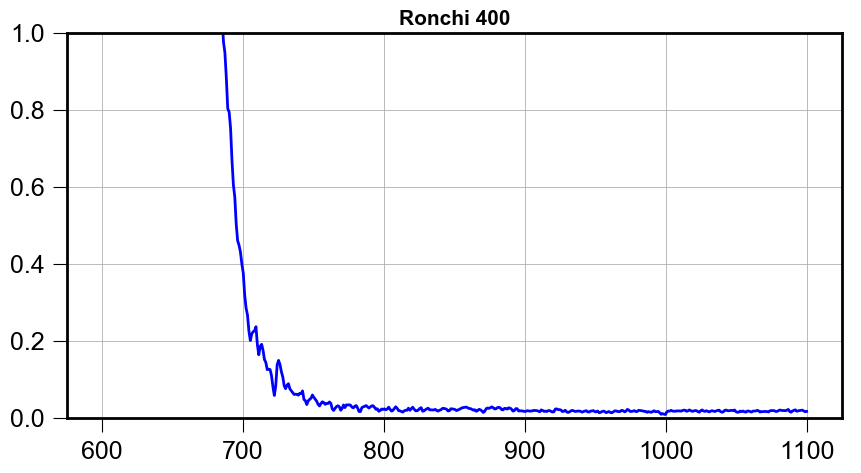

In [51]:
plt.plot(wl_ron400,r_ronn400,"b-")
plt.ylim(0.,1)
plt.title("Ronchi 400")

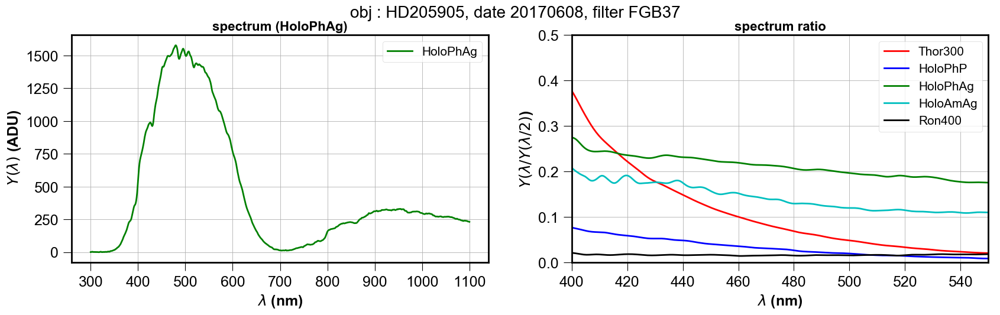

In [52]:
FullPagePlotContaminationinPDF2withRonchi400(lambdas,all_spc,all_interpolate,Selected_Dispersers,dir_top_images,"combinaison_contamin3.pdf",wl_ron400,r_ronn400)

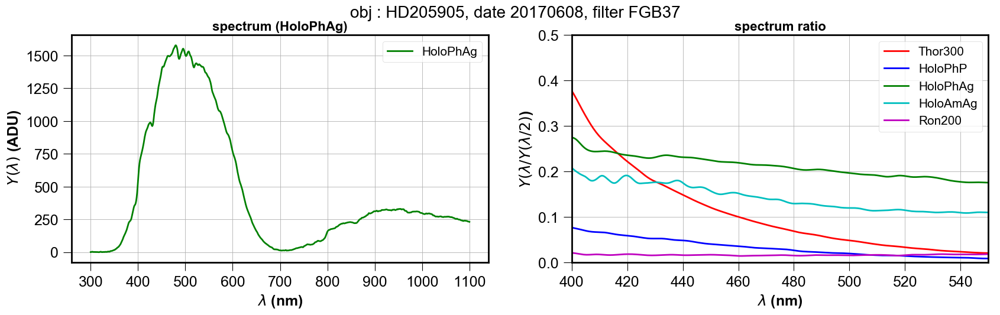

In [53]:
FullPagePlotContaminationinPDF2(lambdas,all_spc,all_interpolate,Selected_Dispersers,dir_top_images,"combinaison_contamin2.pdf")

In [54]:
#FullPagePlotContaminationinPDF3withRonchi400(lambdas,all_spc,all_interpolate,Selected_Dispersers,dir_top_images,"combinaison_contamin3.pdf",wl_ron400,r_ronn400)

# Figures for articles

## Article figure version 0

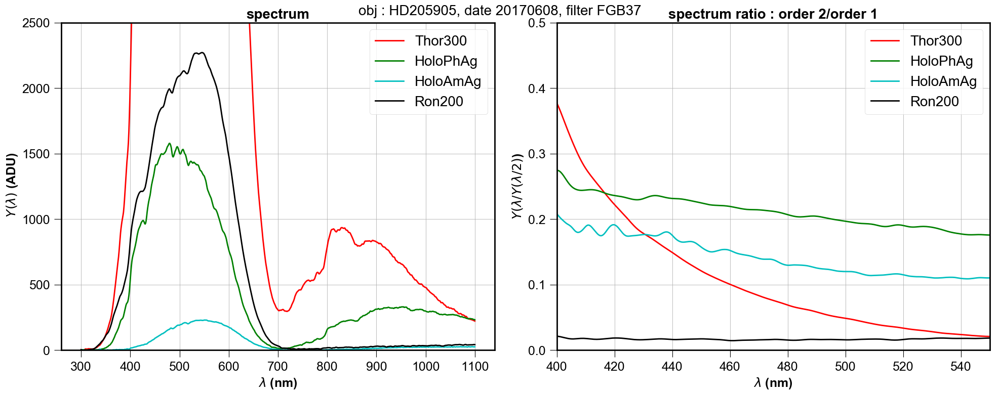

In [55]:
FullPagePlotContaminationinPDF2withRonchi400_NoPhP(lambdas,all_spc,all_interpolate,Selected_Dispersers,dir_top_images,"combinaison_contamin4.pdf",wl_ron400,r_ronn400)

## Article figure version 1

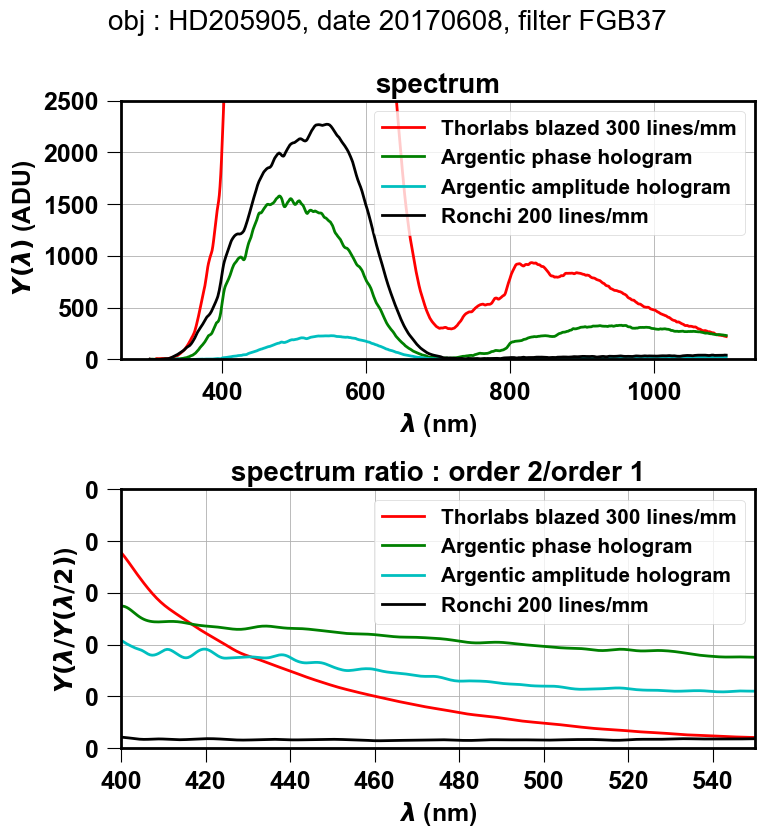

In [56]:
plt.rcParams["font.weight"] = "bold"
plt.rcParams["axes.labelweight"] = "bold"
#plt.rcParams["axes.legendsize"] = 10
FullPagePlotContaminationinPDF2withRonchi400_NoPhP3(lambdas,all_spc,all_interpolate,Selected_Dispersers,dir_top_images,"combinaison_contaminFinal.pdf",wl_ron400,r_ronn400)

## Article figure version 2 : multiply by a factor 2

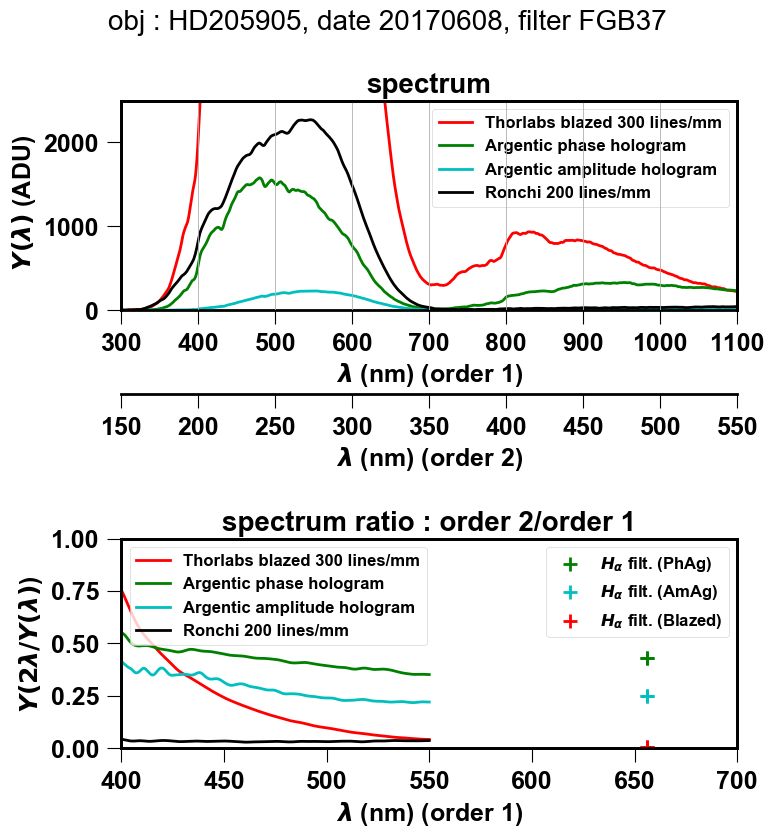

In [57]:
#plt.rcParams["font.weight"] = "bold"
#plt.rcParams["axes.labelweight"] = "bold"
#plt.rcParams["axes.legendsize"] = 10
FullPagePlotContaminationinPDF2withRonchi400_NoPhP4(lambdas,all_spc,all_interpolate,Selected_Dispersers,dir_top_images,"combinaison_contaminFinal.pdf",wl_ron400,r_ronn400)

## Article figure : version 3

(0, ', disperser = ', 'Thorlabs blazed 300 lines/mm', ' dx/dlambda (pix/nm)= ', 0.7338746646740847, ' wavelength = ', 300.0)
(1, ', disperser = ', 'HoloPhP', ' dx/dlambda (pix/nm)= ', 0.7338746646740847, ' wavelength = ', 300.0)
(2, ', disperser = ', 'Argentic phase hologram', ' dx/dlambda (pix/nm)= ', 0.859964171795537, ' wavelength = ', 300.0)
(3, ', disperser = ', 'Argentic amplitude hologram', ' dx/dlambda (pix/nm)= ', 0.859964171795537, ' wavelength = ', 300.0)
(4, ', disperser = ', 'Ronchi 200 lines/mm', ' dx/dlambda (pix/nm)= ', 0.4859519760344783, ' wavelength = ', 300.0)


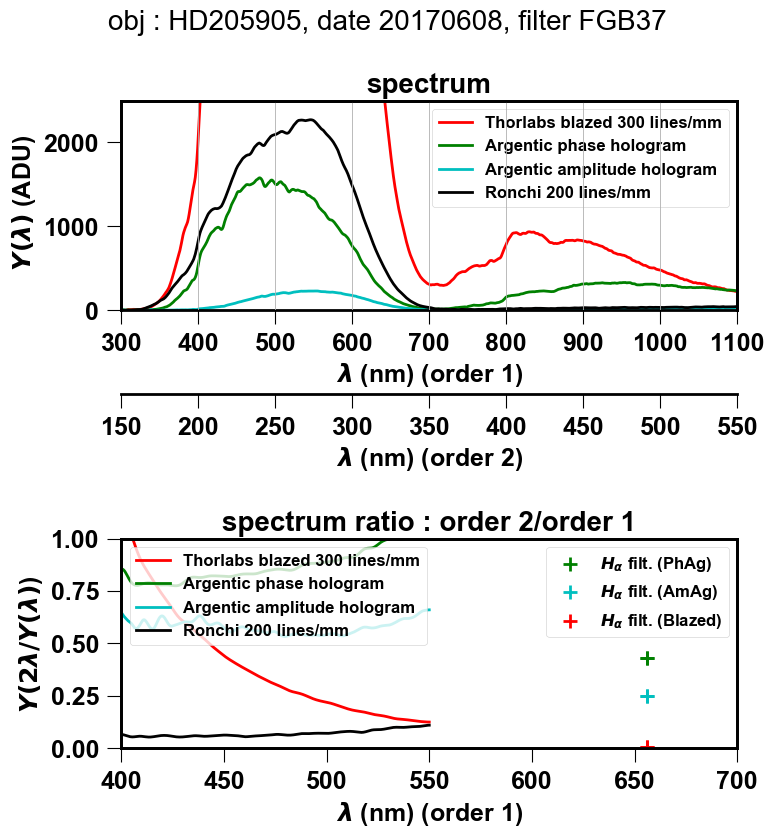

In [115]:
#plt.rcParams["font.weight"] = "bold"
#plt.rcParams["axes.labelweight"] = "bold"
#plt.rcParams["axes.legendsize"] = 10
FullPagePlotContaminationinPDF2withRonchi400_NoPhP5(lambdas,all_spc,all_interpolate,Selected_Dispersers,dir_top_images,"combinaison_contaminFinal.pdf",wl_ron400,r_ronn400)

## Very old plots

(0, ',', 'Thor300')
(1, ',', 'HoloPhP')
(2, ',', 'HoloPhAg')
(3, ',', 'HoloAmAg')
(4, ',', 'Ron200')


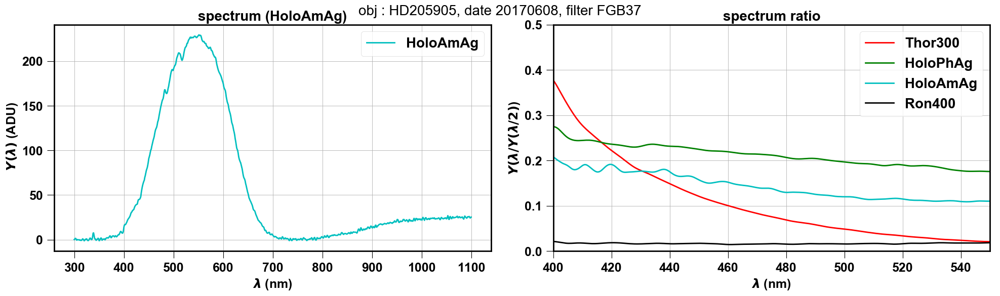

In [58]:
FullPagePlotContaminationinPDF2withRonchi400_NoPhP_2(lambdas,all_spc,all_interpolate,Selected_Dispersers,dir_top_images,"combinaison_contamin5.pdf",wl_ron400,r_ronn400)

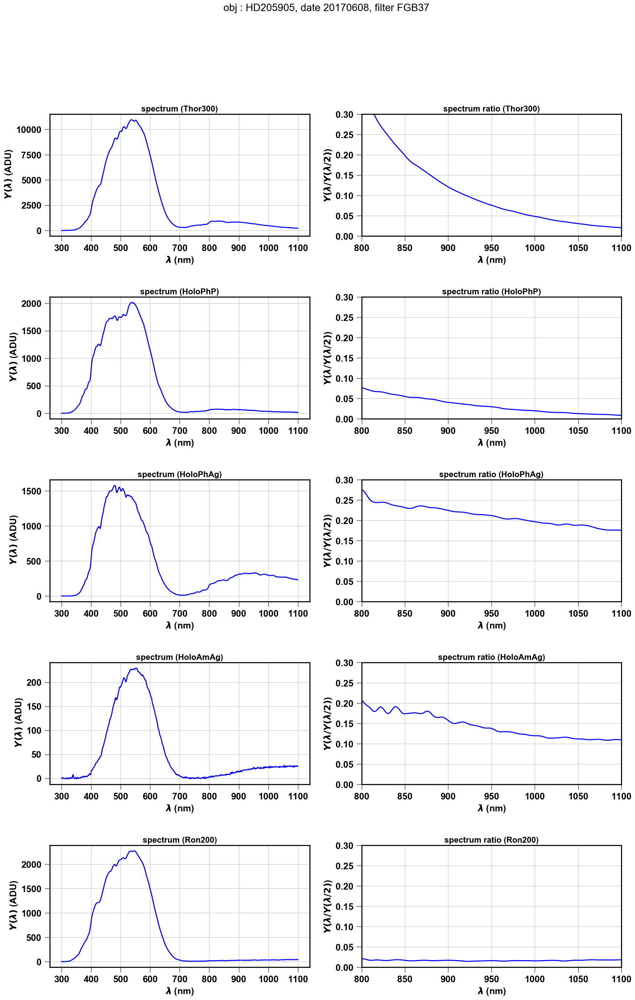

In [59]:
FullPagePlotContaminationinPDF(lambdas,all_spc,all_interpolate,Selected_Dispersers,dir_top_images,"combinaison_contamin.pdf")

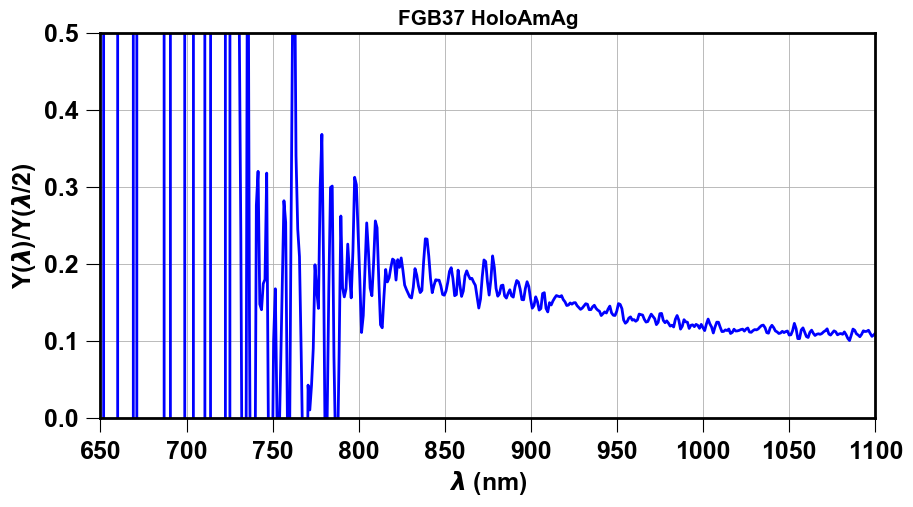

In [60]:
PlotContamination(lambdas,all_spc[sel],all_interpolate[sel],Select_Filt[sel]) 

# Loop

/Users/dagoret/anaconda3/envs/py27/lib/python2.7/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


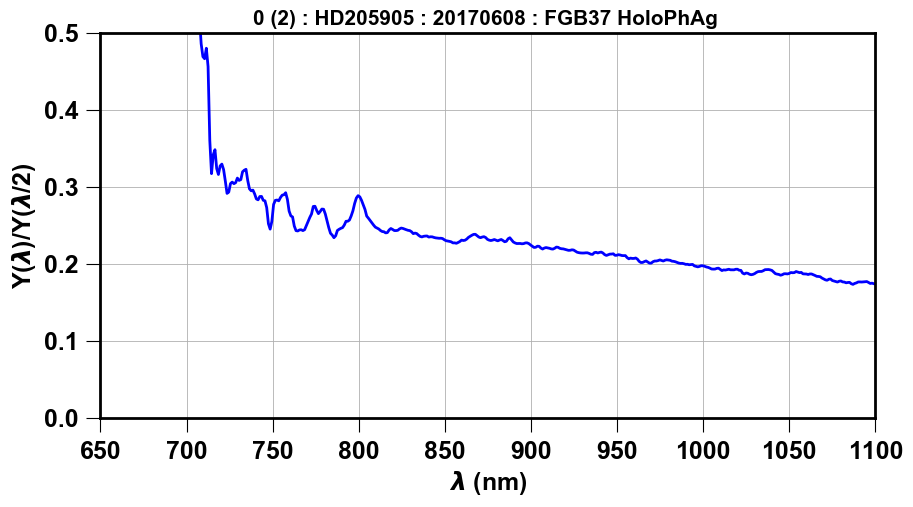

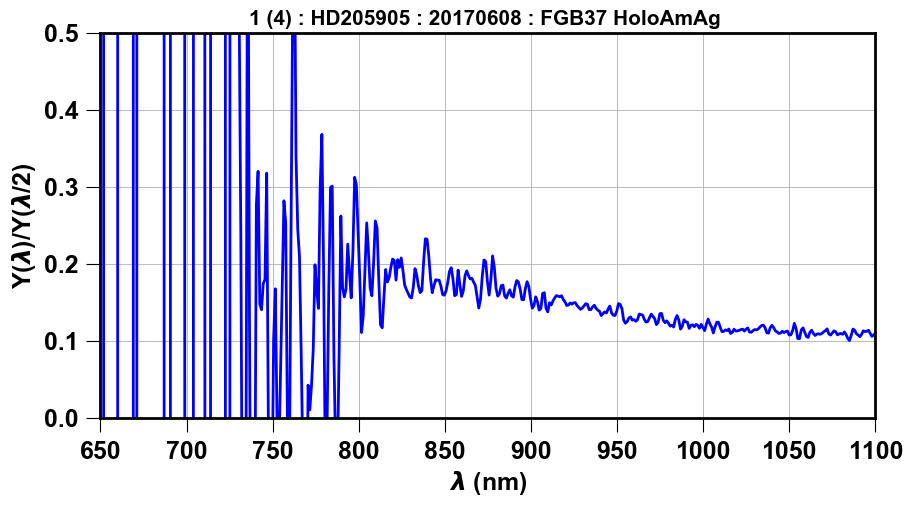

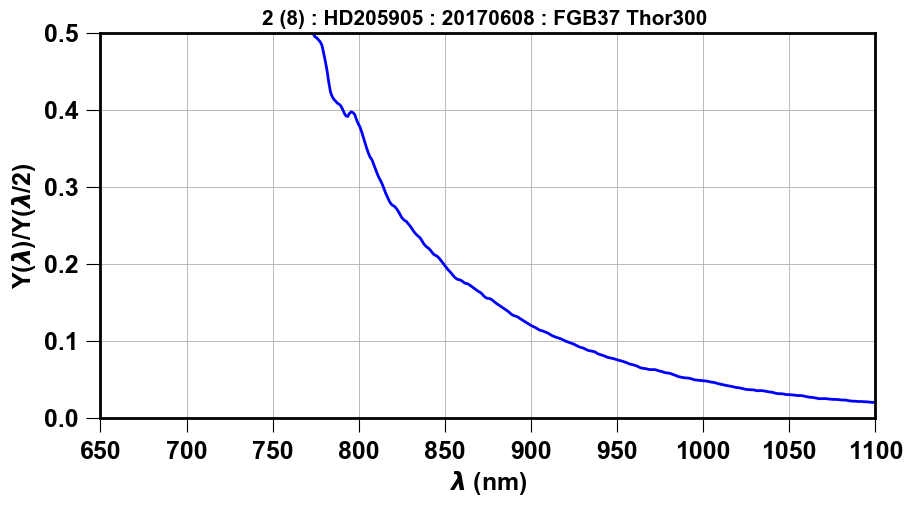

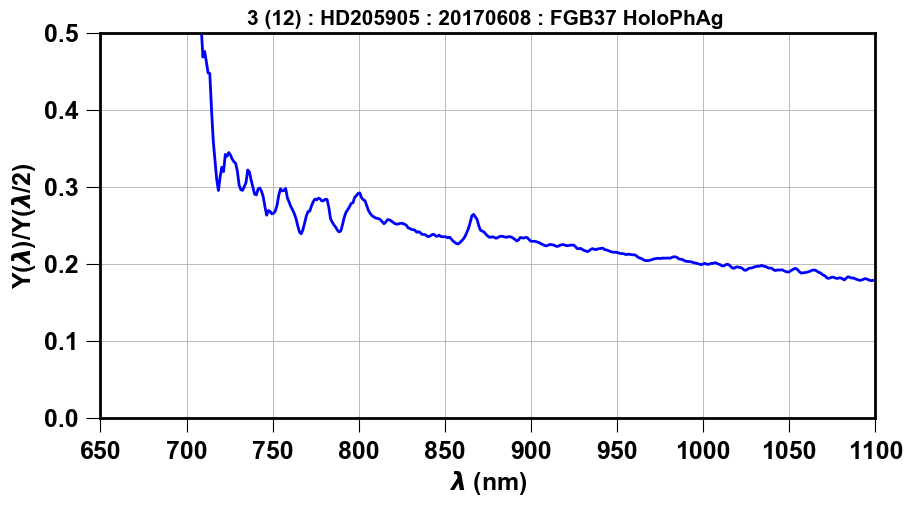

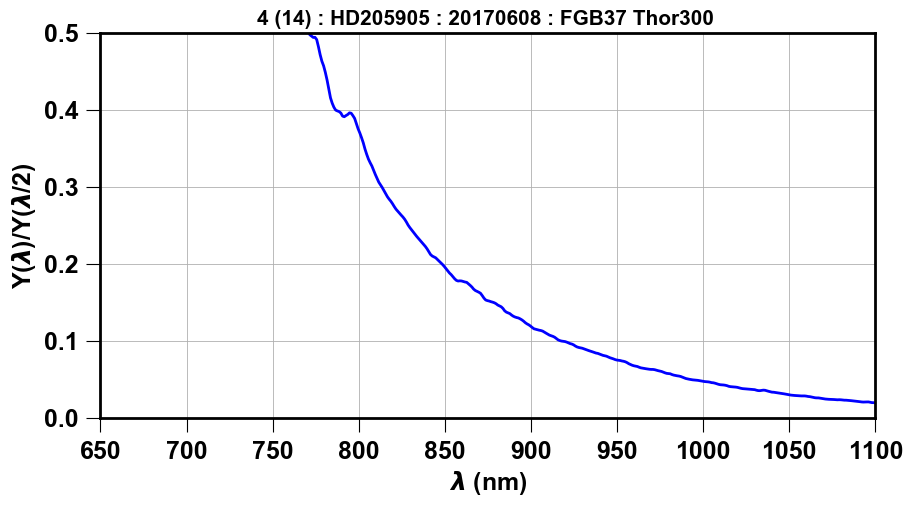

...

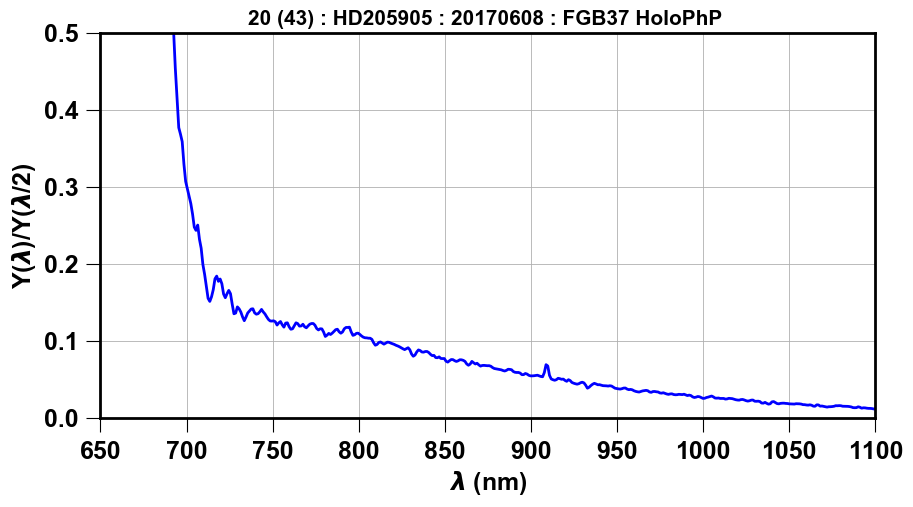

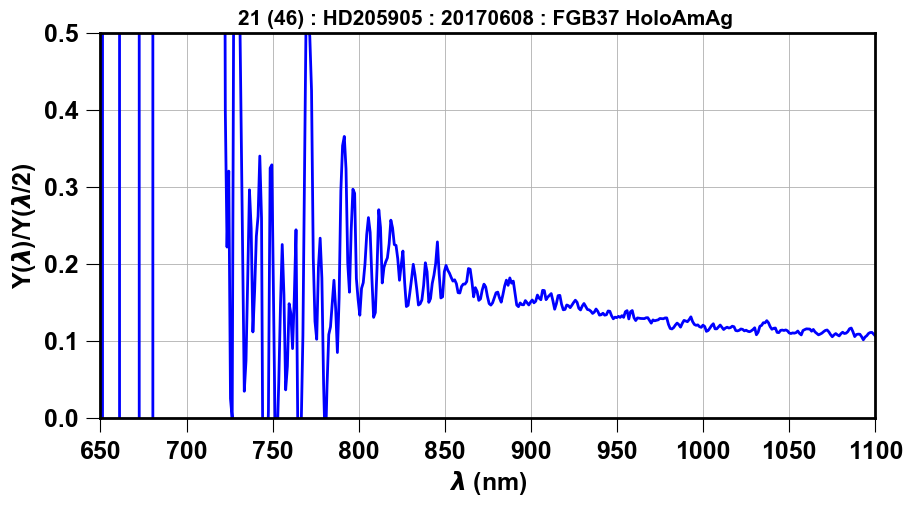

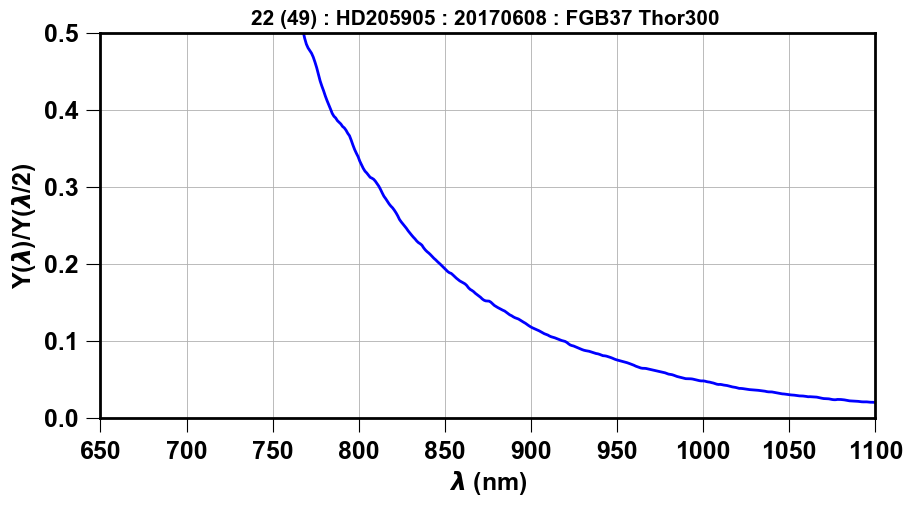

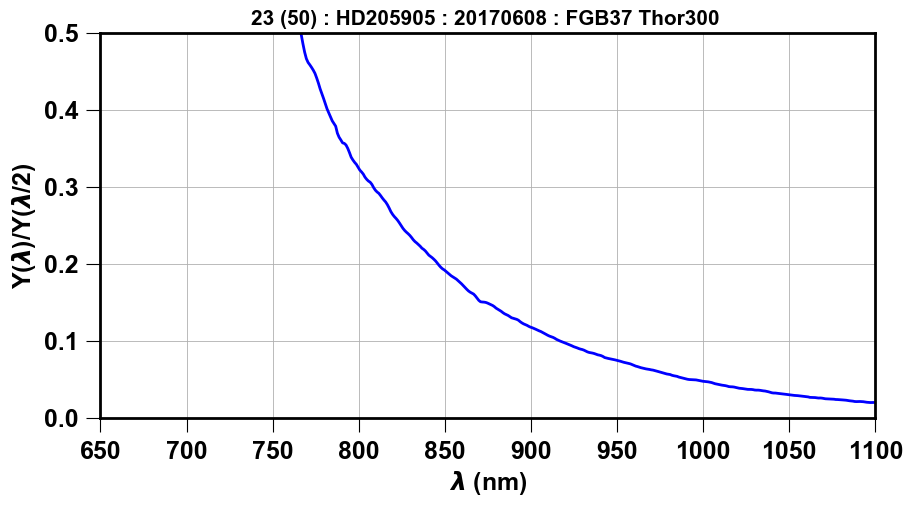

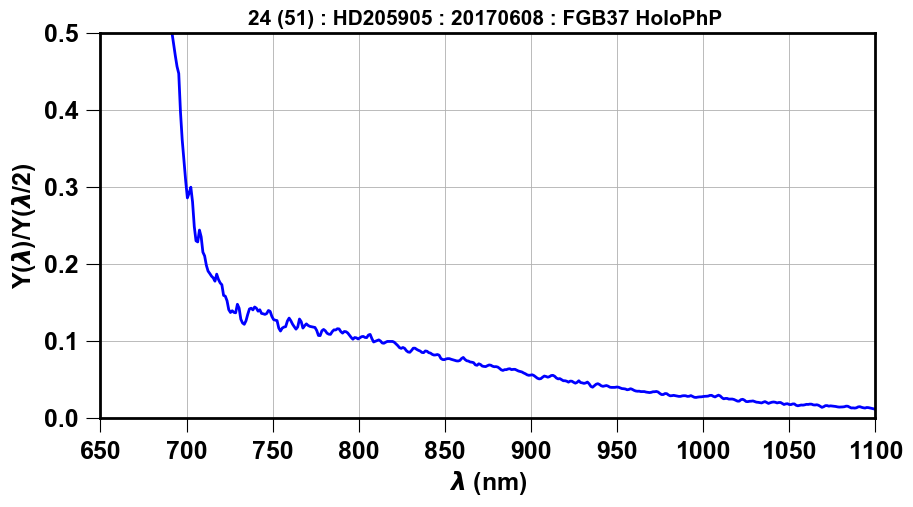

In [61]:
for sel in np.arange(len(Selected_Indexes)):
    title="{} ({}) : {} : {} : {} ".format(sel,Selected_Indexes[sel],object_name,date,Select_Filt[sel])
    PlotContamination(lambdas,all_spc[sel],all_interpolate[sel],title) 

# Produce plots in pdf 

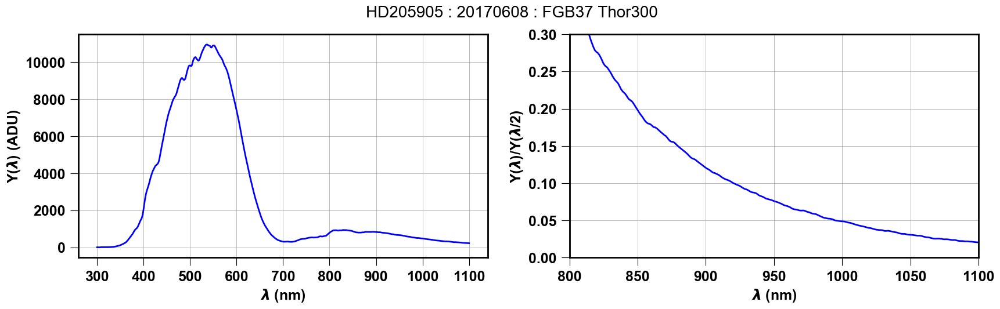

In [62]:
sel=2
title="{} : {} : {} ".format(object_name,date,Select_Filt[sel])
figname='contamination_{}_{}.pdf'.format(Selected_Dispersers[sel],sel)
PlotContaminationinPDF(lambdas,all_spc[sel],all_interpolate[sel],title,dir_top_images,figname)

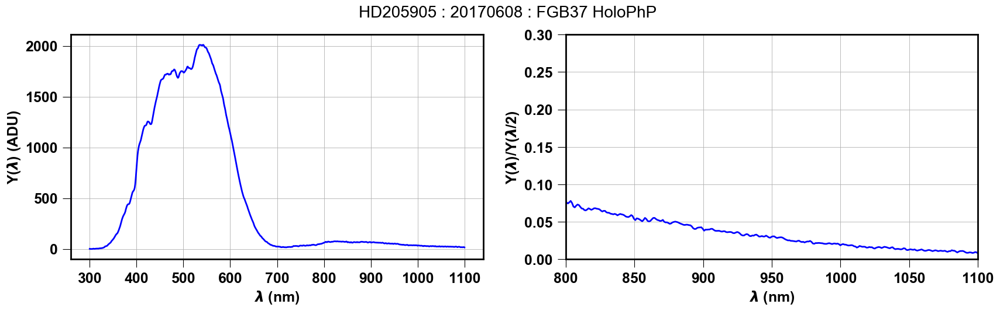

In [63]:
sel=5
title="{} : {} : {} ".format(object_name,date,Select_Filt[sel])
figname='contamination_{}_{}.pdf'.format(Selected_Dispersers[sel],sel)
PlotContaminationinPDF(lambdas,all_spc[sel],all_interpolate[sel],title,dir_top_images,figname)

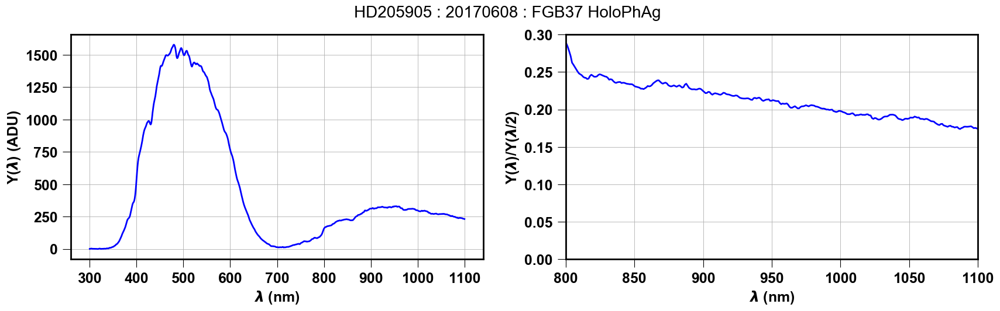

In [64]:
sel=0
title="{} : {} : {} ".format(object_name,date,Select_Filt[sel])
figname='contamination_{}_{}.pdf'.format(Selected_Dispersers[sel],sel)
PlotContaminationinPDF(lambdas,all_spc[sel],all_interpolate[sel],title,dir_top_images,figname)

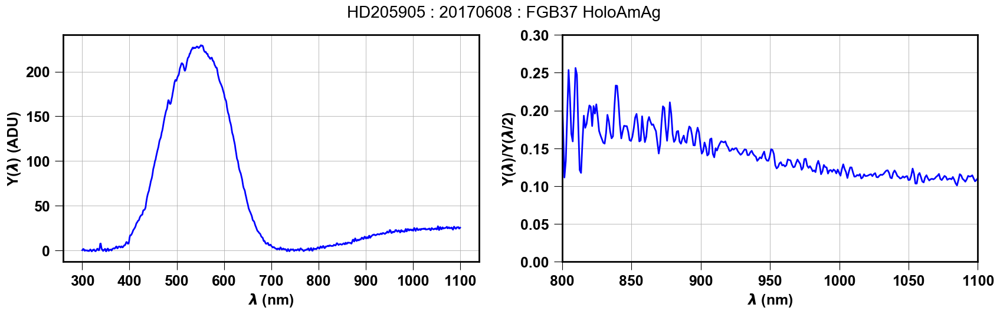

In [65]:
sel=1
title="{} : {} : {} ".format(object_name,date,Select_Filt[sel])
figname='contamination_{}_{}.pdf'.format(Selected_Dispersers[sel],sel)
PlotContaminationinPDF(lambdas,all_spc[sel],all_interpolate[sel],title,dir_top_images,figname)

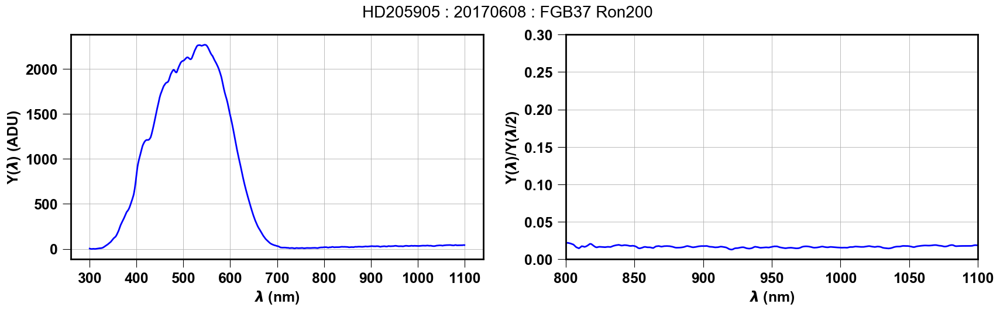

In [66]:
sel=8
title="{} : {} : {} ".format(object_name,date,Select_Filt[sel])
figname='contamination_{}_{}.pdf'.format(Selected_Dispersers[sel],sel)
PlotContaminationinPDF(lambdas,all_spc[sel],all_interpolate[sel],title,dir_top_images,figname)